# EIS Anlaysis Board 🧮

## Set up the environment 🔌

In [1]:
import numpy as np
import autoeis as ae
%load_ext scalene

# Inform AutoEIS how to find Julia
jl = ae.set_julia("/home/amin/.juliaup/bin/julia")

# Uncomment this line if you are running the code for the first time
# ae.initialize_julia()

# Opinionated: Set matplotlib style to arviz-darkgrid
ae.set_parameter()

LOADING
Scalene extension successfully loaded. Note: Scalene currently only
supports CPU+GPU profiling inside Jupyter notebooks. For full Scalene
profiling, use the command line version.


## Load EIS data 📈

In [14]:
fpath = "testdata.txt"
df = ae.load_data(fpath)

frequencies = np.array(df["freq/Hz"]).astype(float)
reals = np.array(df["Re(Z)/Ohm"]).astype(float)
imags = -np.array(df["-Im(Z)/Ohm"]).astype(float)

measurements = reals + imags*1j
df

,freq/Hz,Re(Z)/Ohm,-Im(Z)/Ohm,|Z|/Ohm,Phase(Z)/deg,time/s,<Ewe>/V,<I>/mA,Unnamed: 8
0,200019.480000,1.304171e+02,3.468001e+01,1.349493e+02,-14.891262,10602.358770,-0.040436,-0.000995,NaN
1,149716.770000,1.341570e+02,2.727420e+01,1.369014e+02,-11.491652,10602.733761,-0.040460,-0.000747,NaN
2,112070.290000,1.364035e+02,2.157776e+01,1.380997e+02,-8.989165,10603.232750,-0.040456,-0.000728,NaN
3,83886.695000,1.377822e+02,1.727571e+01,1.388611e+02,-7.146687,10603.607774,-0.040450,-0.000785,NaN
4,62792.953000,1.385546e+02,1.434104e+01,1.392948e+02,-5.909335,10603.981767,-0.040452,-0.000817,NaN
...,...,...,...,...,...,...,...,...,...
62,0.003185,3.891231e+06,1.812847e+06,4.292796e+06,-24.979877,14375.134820,-0.040596,0.000014,NaN
63,0.002385,4.124008e+06,1.907837e+06,4.543928e+06,-24.826071,15634.709475,-0.040596,0.000012,NaN
64,0.001785,4.443237e+06,2.000512e+06,4.872823e+06,-24.239067,17317.803800,-0.040598,0.000011,NaN
65,0.001336,4.779632e+06,2.148920e+06,5.240490e+06,-24.208651,19566.115223,-0.040601,0.000009,NaN


## Automatic EIS analysis 🪄

---------------Data_processing---------------


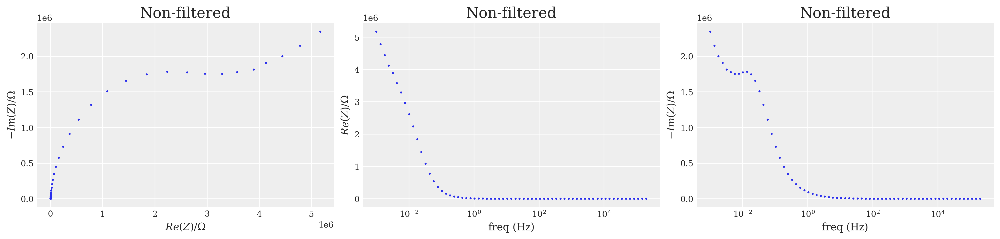

10 1.0 108234.07248008501
20 1.0 17791.147124534236
30 0.5999913288162646 14415.162266844482
ohmic_resistance = 139.9438


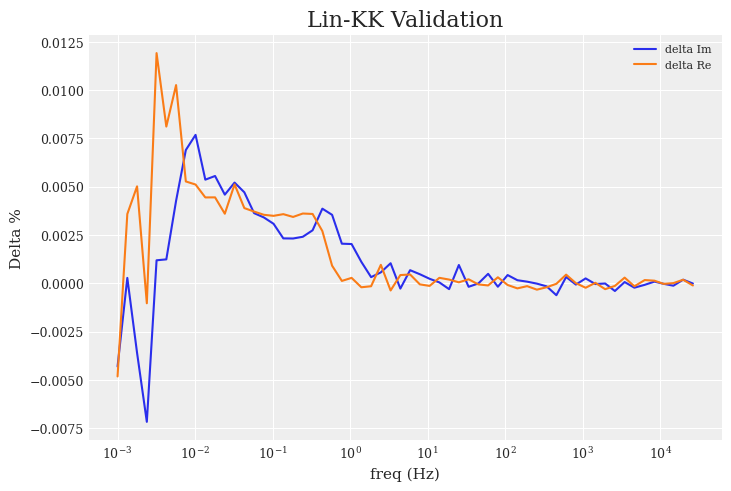

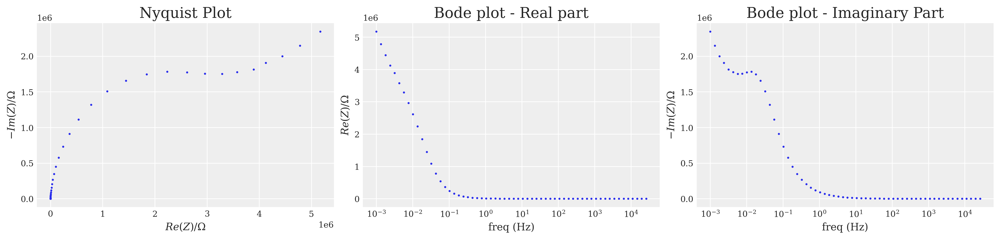

In [15]:
ae.EIS_auto(impedance=measurements, freq=frequencies, fname=fpath, iter_number=1, plot_ECM=False)

**Note:** 
For visualizing the generated equivalent circuit models, please set the variable plot_ECM in the above function as True. However, this is based on an additional package - lcapy and requires a latex compiler. 

In [1]:
# install the lcapy package via pip install
# ! pip install lcapy

# install the latex compiler from the below link:
# https://www.latex-project.org/get/

# call the function to perform analysis (please restart your computer after installing latex compiler)
# ae.EIS_auto(impedance=measurements,freq=frequencies,data_path=data_path,iter_number=5, plot_ECM=True)

**Note:** 
The detailed function definations are shown as below. Following the function part, some examples that demonstrated AutoEis's main functions are shown. 

# Install the required packages

In [1]:
try:
    # general packages for data analysis
    import matplotlib.pyplot as plt
    import numpy as np
    import json
    import pandas as pd
    import math
    import re
    import itertools
    import os
    from os.path import basename
    import sys

    # the packages for EIS ECMs analysis
    import impedance
    from impedance import preprocessing
    from impedance.validation import linKK

    # the packages for bayesian inference
    import arviz as az
    import numpyro
    from numpyro.diagnostics import hpdi,summary,split_gelman_rubin
    import numpyro.distributions as dist
    from numpyro import handlers
    from numpyro.infer import MCMC, NUTS,HMC,HMCECS,BarkerMH,HMCGibbs,DiscreteHMCGibbs
    from numpyro.infer import Predictive
    from numpyro.infer.util import log_likelihood,log_density

    from IPython.display import set_matplotlib_formats
    import jax.numpy as jnp
    from jax import random, vmap
    from jax.scipy.special import logsumexp
    import jax

    # the package for storage
    import dill

    # the package for ignoring warnings
    import warnings
    warnings.filterwarnings('ignore') # ignore the warnings 

    # the packages for calling julia file/function in python
    from julia import Julia

except ImportError:
    import pip
    pip.main(["install","--user","matplotlib","numpy","pandas","impedance","arviz","numpyro","jax","dill","julia"])
pass

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


# Define the functions

In [2]:
def set_julia(julia_executable_path:'str')->'Julia object':
    
    """Set the julia environment in python
    
        Parameter
        ---------
        julia_executable_path:str
            path of julia executable file (julia.exe) in your computer

    """
    # define the path of julia program
    julia_path = julia_executable_path # path of julia executable file (julia.exe)
    j = Julia(runtime= julia_path)
    return j

In [3]:
def initialize_julia():
    
    """Install the julia's dependencies"""
    
    # import julia's basic packages via PyCall
    from julia import Pkg
    from julia import Base
    # install the required packages
    Base.ENV["PYTHON"] = sys.executable
    Pkg.build("PyCall")
    Pkg.add("EquivalentCircuits")
    Pkg.add("DelimitedFiles")
    Pkg.add("StringEncodings")
    Pkg.add('Pandas')
    Pkg.add('DataFrames')
    pass

In [4]:
def import_julia():
    from julia import Pkg
    from julia import Base
    from julia import EquivalentCircuits as ec
    from julia import DelimitedFiles
    from julia import StringEncodings
    from julia import Pandas
    from julia import DataFrames
    return ec,DataFrames,Pandas,Base

In [5]:
def set_parameter():
    
    """Set the parameters of figures"""
    
    # set the parameters for plots
    plt.rcParams['figure.figsize']=(19.6, 10.8)

    # set the parameters for plots
    az.style.use("arviz-darkgrid")

In [6]:
# define a function to create new folds for data storage
def mkdir(path):
    # check if the given folder already existed
    folder = os.path.exists(path)
    if not folder:
        # create a new folder
        os.makedirs(path)  
    pass

In [7]:
def reset_storage():

    """Reset the working path as the original data path (Please run me when you encountered file loading error)
    """
    
    for i in range(2):
        os.chdir(os.path.abspath(os.path.dirname(os.getcwd())))

In [8]:
def load_data(data_path:'str')->'pd.DataFrame':
    
    """ Load the required EIS data(impedance and frequency) from a given data path
        
        Parameter
        ---------
        data_path: str
            the data path of the given EIS data
        
        Returns
        --------
        df: pd.DataFrame
            the dataframe of the given EIS data
    """
    try:
        f = open(data_path)
    except FileNotFoundError:
        print("Error: No such file or directory in the current folder. Please recheck the file's name")
        return 
    if data_path.endswith(".json"):
        data = json.load(f)
        df = pd.DataFrame(data)
    elif data_path.endswith(".csv"):
        df = pd.read_csv(f)
    elif data_path.endswith(".txt"):
        df = pd.read_csv(data_path, sep="\t")
    elif data_path.endswith(".xlsx"):
        df = pd.read_excel(data_path)
    elif data_path.endswith(".pkl"):
        with open(data_path, 'rb') as f:
            data = pickle.load(f)
        df = pd.DataFrame(data)
    try:
        return df
    except UnboundLocalError:
        print('Error: The file format of the given data is not supported in this function.')

In [9]:
def plot_EIS(freq:'np.array',impedance:'np.array' = "",reals:'np.array' = "",imags:'np.arary' = "", kind:'string' = 'Nyquist'):
    
    """ Plot impedance data as nyquist plot and bode plots using matplotlib
    
        Parameters
        ----------
        freq: np.array of floats
            the frequencies of EIS data points
            
        impedance: np.array of complex numbers
            the impedance data
            
        reals: np.array of floats
            the real part of the impedance data
            
        imags: np.array of floats
            the imag part of the impedance data
            
        kind: string 
            the kind of plots, can be either Nyquist or Bode
            
        Returns
        ----------
        No returns
    """
    
    
    # plot the Nyquist plot
    if kind == 'Nyquist':
        if impedance != "":
            reals = impedance.real
            imags = impedance.imag
        frequencies = freq
        
        #Set plotting parameters for the data
        fig,axes = plt.subplots(1,3,figsize=(15,3.5),dpi=300)

        axes[0].scatter(reals,-imags,s=1.5)
        axes[0].set_xlabel(r'$Re(Z) / \Omega$')
        axes[0].set_ylabel(r'$-Im(Z) / \Omega$')
        axes[0].set_title('Nyquist plot')

        axes[1].scatter(freq,reals,s=1.5)
        axes[1].set_xscale('log')
        axes[1].set_xlabel('freq (Hz)')
        axes[1].set_ylabel(r'$Re(Z) / \Omega$')
        axes[1].set_title('Bode plot - real part')

        axes[2].scatter(freq,-imags,s=1.5)
        axes[2].set_xscale('log')
        axes[2].set_ylabel(r'$-Im(Z) / \Omega$')
        axes[2].set_xlabel('freq (Hz)')
        axes[2].set_title('Bode plot - imaginary part')
        plt.show()
    
    # plot the Bode plot
    elif kind == 'Bode':
        if impedance != "":
            reals = impedance.real
            imags = impedance.imag
        frequencies = freq

        # Calculate the magnitude and phase of the impedance data
        magnitude = (reals**2 + imags**2)**(1/2)
        phase = np.arctan(imags/reals)
        
        # Set plotting parameters for the data
        fig,ax = plt.subplots(figsize=(5,3.5),dpi=300)

        # plot the magnitude plot
        ax.scatter(np.log10(frequencies),magnitude,c ='b',label='Magnitude')
        ax.set_xlabel("log(freq)")
        ax.set_ylabel("Magnitude")
        ax.set_title('Bode plot')
        # plot the phase plot
        ax2 = ax.twinx()
        ax2.scatter(np.log10(frequencies),phase,c='r', alpha = 0.7,marker='v',label = 'phase')
        ax2.set_ylabel('Phase')
        fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax.transAxes)
        fig.show()
    return fig

In [10]:
def find_ohmic_resistance(reals:'np.array',imags:'np.array',data_path:'string',save:'bool'=True)->'float':
    
    """ Extract the ohmic resistance of impedance data by doing a 5th order polynomial fit (with 5% accepted relative error)
        
        Parameters:
        ----------
        reals: np.array of floats
            the real part of the impedance data
            
        imags: np.array of floats
            the imag part of the impedance data
        
        data_path:str
            the storage path
            
        Return:
        -------
        ohmic_resistance: float
            the ohmic resistance of impedance data
    """
    # select the high-frequency impedance data
    high_f_real = reals[0:10] 
    high_f_imag = imags[0:10]
    high_f_phase = np.arctan(high_f_imag/high_f_real)
    index, = np.where(abs(high_f_phase) == abs(high_f_phase).min()) #finds minimum phase value, note returns as a tuple
    ohmic_resistance = high_f_real[index[0]] # extract the ohmic resistance
    if save:
        dirStr, ext = os.path.splitext(data_path)
        folder_name = dirStr.split('\\')[-1]
        mkdir(folder_name)
        with open(f'{folder_name}\\ohmic_resistance = {round(ohmic_resistance,4)}.txt','w') as f:
            f.write(f"ohmic resistance = {ohmic_resistance}")
    return ohmic_resistance

In [11]:
def pre_processing(impedance:'np.array',freq:'np.array',threshold:'float',data_path:'str')->'Returns: pd.DataFrame / float / float':
    
    """ Pre-process impedance data by deleting data with positive imaginary part at high-freq range, and by kk validation
        
        Parameters:
        ----------
        impedance: np.array of complex numbers
            the impedance data
            
        freq: np.array of float
            the frequencies of EIS data points
            
        threshold: float
            the parameter that controls the filtering effect of KK validation
        
        data_path:string
            the storage path
            
        Returns:
        --------
        Zdf_mask: pd.DataFrame with 3 columns
            the impedance data after pre-processing
            
        ohmic_resistance: float
            the ohmic resistance of impedance data
            
        RMSE_value:float
            the mean square error between KK validated data and original data
    """
    
    # set plotting params and data directory
    tick_size = 9
    label_size = 11

    plt.rcParams['font.family'] = 'serif'
    plt.rcParams["mathtext.fontset"] = "dejavuserif"
    plt.rcParams['xtick.labelsize'] = tick_size
    plt.rcParams['ytick.labelsize'] = tick_size
    plt.rcParams['axes.labelsize'] = label_size
    plt.rcParams['legend.fontsize'] = tick_size - 1
    
    # set the storage folder
    dirStr, ext = os.path.splitext(data_path)
    folder_name = dirStr.split('\\')[-1]
    mkdir(folder_name)
    
    # load the data
    Re_Z = impedance.real
    Im_Z = impedance.imag
    # Set plotting parameters for the non-filtered data
    fig,axes = plt.subplots(1,3,figsize=(15,3.5),dpi=300)
    
    # Plot the non-filtered plots
    axes[0].scatter(Re_Z,-Im_Z,s=1.5)
    axes[0].set_xlabel(r'$Re(Z) / \Omega$')
    axes[0].set_ylabel(r'$-Im(Z) / \Omega$')
    axes[0].set_title('Non-filtered')
    axes[1].scatter(freq,Re_Z,s=1.5)
    axes[1].set_xscale('log')
    axes[1].set_xlabel('freq (Hz)')
    axes[1].set_ylabel(r'$Re(Z) / \Omega$')
    axes[1].set_title('Non-filtered')
    axes[2].scatter(freq,-Im_Z,s=1.5)
    axes[2].set_xscale('log')
    axes[2].set_ylabel(r'$-Im(Z) / \Omega$')
    axes[2].set_xlabel('freq (Hz)')
    axes[2].set_title('Non-filtered')
    plt.savefig(f'{folder_name}\\Non-filtered_Nyquist and Bode plots.png', dpi=300)
    plt.show()

    ### FILTER 1 - High frequenciesuency Region
    ### Find index where phase_Zwe == minimum, remove all high frequency imag values below zero
    # find index: 10khz - 100khz
    # bug
    try:
        pos = np.where((1000<= freq)&(freq<= 1000000))
        index, = np.where(abs(Im_Z[pos]) == abs(Im_Z[pos]).min()) #finds minimum phase value, note returns as a tuple
    except ValueError:
        index = [0]
    mask_phase = [True]*len(Im_Z)
    for i in range(len(Im_Z)):
        if i < index:
            mask_phase[i] = False

    freq = freq[index[0]:]
    Z = impedance[index[0]:]
    Re_Z = Re_Z[index[0]:]
    Im_Z = Im_Z[index[0]:]


    # Filter 1.2 delete all impedance points with positive im impedance at high frequency
    pos2 = np.where(Im_Z>0)
    positive_im = pos2[0][np.where(pos2[0] <= len(pos[0]))]
    freq = np.delete(freq,positive_im)
    Re_Z = np.delete(Re_Z,positive_im)
    Im_Z = np.delete(Im_Z,positive_im)
    Z = np.delete(Z,positive_im)

    ### FILTER 2 - Low Frequency Region
    ### Lin-KK data validation to remove 'noisy' data
    ### For Lin-KK, the residuals of Re(Z) and Im(Z) are what will be used as a filter. I have found based on the data set that
    ### somewhere ~0.05% works the best
    M, mu, Z_linKK, res_real, res_imag = linKK(freq, Z, c=.5, max_M=100, fit_type='complex', add_cap=True)
    # Calculate RMSE
    RMSE_value = RMSE_calculator(Z, Z_linKK)
        
    # Plot residuals of Lin-KK for visualization purposes. 
    plt.plot(freq, res_imag, label = 'delta Im')
    plt.plot(freq, res_real, label = 'delta Re')
    plt.xlabel('freq (Hz)')
    plt.ylabel('Delta %')
    plt.xscale('log')
    plt.title('Lin-KK Validation')
    plt.legend()
    plt.savefig(f'{folder_name}\\Lin-KK Validation.png', dpi=300)

    
    # Need to set a threshold limit for when to filter out the noisy data of the residuals
    # threshold = 0.05 # USER DEFINE!!!
    
    ########## 2023/05/03 modification #########
    Zdf_mask = np.arange(1)
    
    while len(Zdf_mask) <= 0.7*len(Z):
        # filter the data according to imaginary residuals
        mask = [False]*(len(res_imag))
        for i in range(len(res_imag)):
            if res_imag[i] < threshold:
                mask[i] = True
            else:
                break

        freq_mask = freq[mask]
        Z_mask = Z[mask]
        Re_Z_mask = Re_Z[mask]
        Im_Z_mask = Im_Z[mask]

        # filter the data according to real residuals
        mask = [False]*(len(res_real))
        for i in range(len(res_real)):
            if res_real[i] < threshold:
                mask[i] = True
            else:
                break

        freq_mask = freq[mask]
        Z_mask = Z[mask]
        Re_Z_mask = Re_Z[mask]
        Im_Z_mask = Im_Z[mask]

        # find the ohmic resistance
        try:
            ohmic_resistance = find_ohmic_resistance(Re_Z_mask,Im_Z_mask,data_path)
        except ValueError:
            print("Error: Didn't find the ohmic resistance. Please recheck the data or increase the KK threshold.")
        #Putting into a dataframe for use with plotting and program
        values_mask = np.array([freq_mask,Re_Z_mask,Im_Z_mask])
        labels = ['freq','Zreal','Zimag']
        Zdf_mask = pd.DataFrame(values_mask.transpose(), columns = labels)
        threshold += 0.01
    
    print(f"ohmic_resistance = {ohmic_resistance}")

    # Plot the data to see how the filter performed
    fig,axes = plt.subplots(1,3,figsize=(15,3.5),dpi=300)
    axes[0].scatter(Zdf_mask['Zreal'].values,-Zdf_mask['Zimag'].values,s=1.5)
    #if index == 0:
    #    axes[0].scatter(Re_Z_mask, fz(Re_Z_mask),s=1.5,c='r')
    axes[0].set_xlabel(r'$Re(Z) / \Omega$')
    axes[0].set_ylabel(r'$-Im(Z) / \Omega$')
    axes[0].set_title('Nyquist Plot')
    axes[1].scatter(Zdf_mask['freq'].values,Zdf_mask['Zreal'].values,s=1.5)
    axes[1].set_xscale('log')
    axes[1].set_xlabel('freq (Hz)')
    axes[1].set_ylabel(r'$Re(Z) / \Omega$')
    axes[1].set_title('Bode plot - Real part')
    axes[2].scatter(Zdf_mask['freq'].values,-Zdf_mask['Zimag'].values,s=1.5)
    axes[2].set_xscale('log')
    axes[2].set_ylabel(r'$-Im(Z) / \Omega$')
    axes[2].set_xlabel('freq (Hz)')
    axes[2].set_title('Bode plot - Imaginary Part')
    plt.savefig(f'{folder_name}\\Filtered_Nyquist and Bode plots.png', dpi=300)
    plt.show()
    
    if threshold != 0.06:
        print(f"Warning: the default threshold (0.05) dropped too much points and indicated a data-quality concern. Please be careful of using the filtered data.The current selected threshold is {threshold-0.01}")

    return Zdf_mask,ohmic_resistance,RMSE_value


In [12]:
def save_processed_data(input_name:'string', data_stored:'pd.DataFrame')->'string':
    
    """ Store the processed EIS data in a .csv file
        
        Parameters:
        -----------
        input_name: str
            the data path of the given EIS data
            
        data_stored: pd.DataFrame
            the impedance data after pre-processing
        
        Returns:
        --------
        file_name: str
            the data path of the processed EIS data
    """
    
    # set the storage path
    dirStr, ext = os.path.splitext(input_name)
    folder_name = dirStr.split('\\')[-1]
    mkdir(folder_name)
    
    if input_name.endswith(".json"):
        file_name = input_name.split(".json")[0]
    elif input_name.endswith(".csv"):
        file_name = input_name.split(".csv")[0]
    elif input_name.endswith(".txt"):
        file_name = input_name.split(".txt")[0]
    elif input_name.endswith(".xlsx"):
        file_name = input_name.split(".xlsx")[0]
    elif input_name.endswith(".pkl"):
        file_name = input_name.split(".pkl")[0]
    data_stored.to_csv(folder_name+'//'+folder_name+'_processed'+".csv",header = None,index=False)
    
    data_stored.to_csv('temp'+".csv",header = None,index=False)
    return file_name + ".csv"

In [13]:
def ECM_generation(processed_data:'pd.DataFrame',times:'int' = 100, head:'int' = 12,save:'bool'=True):
    
    """Generate ECMs via evolutionary algorithms
    
        Parameters:
        ------------
        processed_data:pd.DataFrame
            the processed data after KK validation
            
        times:int
            the number of times the ECM generation process is performed (default = 100)
            
        head:int
            the complexity of ECM search space (default = 12)
            
        save:bool
            determine to save the results file or not
        
        Return:
        ------------
         df_results:pd.DataFrame
            the dataframe that stores ECM solutions generated by the evolutionar algorithm
    """
    ec,jl_df,jl_pd,jl_Base = import_julia()

    ECM_solution = []
    for i in range(times):
        circuit_i = ec.circuit_evolution(np.array(processed_data['Zreal'])+1j*np.array(processed_data['Zimag']),np.array(processed_data['freq']),head = head, terminals="RLP")
        if circuit_i != jl_Base.nothing:
            ECM_solution.append(circuit_i)
    df_results = jl_pd.DataFrame(jl_df.DataFrame(ECM_solution))
    if len(df_results) == 0:
        print('Warning: No plausible ECM is found. Please consider to enlarge the search space.')
        return 
    for i in range(len(df_results)):
        df_results['Parameters'][i] = jl_Base.string(df_results['Parameters'][i])
    if save:
        df_results.to_csv('df_circuits.csv',index=False)
    return df_results

In [14]:
def load_results(file_path:'string')->'pd.DataFrame':
    
    """ load the ECMs results generated by the julia program and convert it to pd.DataFrame
        
        Parameters:
        -----------
        file_path: str
            the file path of ECMs results
            
        Returns:
        --------
        df_circuits: pd.DataFrame
            the dataframe that stored ECMs results generated by the julia program (2 columns)
    """
    
    df_circuits = pd.read_csv(file_path)
    if len(df_circuits) == 0:
        print('Error: No plausible ECM founded. Please run ECM generation more times.')
    return df_circuits

In [15]:
def split_components(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Split all the components and their corresponding values of each ECMs
    
        Parameter:
        ---------
        df_circuits: pd.DataFrame
            the dataframe that stored ECMs results generated by the julia program (2 columns)
            
        Return:
        -------
        df_circuits: pd.DataFrame
            the dataframe that stored ECMs results generated by the julia program (6 columns)
    """
    
    # define some regular expression pattern to separate each kind of elements
    resistor_p = re.compile(r'[R][0-9][a-z]? = [0-9]*\.[0-9]*')
    capacitor_p = re.compile(r'[C][0-9][a-z]? = [0-9]*\.[0-9]*')
    inductor_p = re.compile(r'[L][0-9][a-z]? = [0-9]*\.[0-9]*')
    CPE_p = re.compile(r'[P][0-9][a-z]? = [0-9]*\.[0-9]*')

    # initialize some lists to store the values of each kind of elements
    resistors_list = []
    capacitors_list = []
    inductors_list = []
    CPEs_list = []

    for i in range(len(df_circuits['Parameters'])):
        resistors = resistor_p.findall(df_circuits['Parameters'][i])
        capacitors = capacitor_p.findall(df_circuits['Parameters'][i])
        inductors = inductor_p.findall(df_circuits['Parameters'][i])
        CPEs = CPE_p.findall(df_circuits['Parameters'][i])

        resistors_list.append(resistors)
        capacitors_list.append(capacitors)
        inductors_list.append(inductors)
        CPEs_list.append(CPEs)

    df_circuits['Resistors'] = resistors_list
    df_circuits['Capacitors'] = capacitors_list
    df_circuits['Inductors'] = inductors_list
    df_circuits['CPEs'] = CPEs_list
    
    return df_circuits

In [16]:
def capacitance_filter(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Filter the circuits by ideal capacitors
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results generated by the julia program (6 columns)
           
        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results (without ideal capacitors) generated by the julia program (6 columns)
    """
    
    for i in range(len(df_circuits['Capacitors'])):
        if df_circuits['Capacitors'][i] != []:
            df_circuits.drop([i],inplace = True)
    df_circuits.reset_index(drop=True,inplace=True)
    return df_circuits

In [17]:
def find_series_elements(circuit:'string')->'string':
    
    """ Extract the series componenets existed in the circuit
    
        Parameter:
        ----------
        circuit: str
            the string that stores the configuration of a given circuit
        
        Return:
        -------
        series_circuit: str
            the string that stores the series parts of a given circuit
    """
    
    series_circuit = []
    identifior = 0
    for i in range(len(circuit)):
        if circuit[i] == '[':
            identifior += 1
        if identifior == 0:
            series_circuit.append(circuit[i])
        if circuit[i] == ']':
            identifior -= 1
        # elif identifior != 0:
        #    index_list.append([False])
    series_circuit = ''.join(series_circuit)
    return series_circuit

In [18]:
def ohmic_resistance_filter(df_circuits:'pd.DataFrame', ohmic_resistance:'float')->'pd.DataFrame':
    
    """ Extract the ohmic resistance of each circuit and filter the circuits according to the values (with 15% buffer)
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results (without ideal capacitors) generated by the julia program (6 columns)
        
        ohmic_resistance: float
            the ohmic resistance of the given EIS data
            
        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results (without ideal capacitors/with correct ohmic resistance) generated by the julia program (6 columns)

            
    """
    
    for i in range(len(df_circuits['Circuit'])):
        # find the series elements
        series_circuit = find_series_elements(circuit = df_circuits['Circuit'][i])
        # find the series resistors
        find_R = re.compile(r'R[0-9]')
        series_resistors = find_R.findall(series_circuit)
        # initiate a list to store series resistors' values for future comparison
        R_values_list = []
        for j in range(len(series_resistors)):
            value_R_p = re.compile(f'{series_resistors[j]} = [0-9]*\.[0-9]*')
            values_R_withid = value_R_p.findall(''.join(df_circuits['Resistors'][i]))
            value_R_p2 = re.compile(r'[0-9]*\.[0-9]*')
            for k in range(len(values_R_withid)):
                R_value = value_R_p2.findall(values_R_withid[k])
                R_values_list.append(R_value)
        if R_values_list == []:
            df_circuits.drop([i],inplace = True)
        else:
            value_identify_list = []
            for m in range(len(R_values_list)):
                if float(R_values_list[m][0]) < ohmic_resistance * 0.85 or float(R_values_list[m][0]) > ohmic_resistance * 1.15:
                    value_identify_list.append(False)
                else:
                    value_identify_list.append(True)
            if True not in value_identify_list:
                df_circuits.drop([i],inplace = True)

    df_circuits.reset_index(drop=True,inplace=True)
    return df_circuits

In [19]:
def series_filter(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Filter the circuits by checking if any parallel structure included capacitors
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results generated by the julia program (6 columns)
           
        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results (without ideal capacitors) generated by the julia program (6 columns)
    """
    
    test_pattern = re.compile(r'\[')
    for i in range(len(df_circuits['Circuit'])):
        test_circuit = df_circuits['Circuit'][i]
        if test_pattern.findall(test_circuit) == False:
            df_circuits.drop([i],inplace = True)
    df_circuits.reset_index(drop=True,inplace=True)
    return df_circuits

In [20]:
def generate_mathematical_expression(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Generate the mathematical expression of each circuit
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored ECMs results (without ideal capacitors/with correct ohmic resistance) generated by the julia program (6 columns)
        
        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (7 columns)

    """
    
    # define two kinds of pattern to find all elements in the circuit
    test_pattern = re.compile(r'([CLRP])([0-9]+)+')
    test_pattern_2 = re.compile(r'[CLRP][0-9]+')
    
    # create a list to store the mathematical expressions
    new_circuits = []
    
    for i in range(len(df_circuits['Circuit'])):
        circuit = df_circuits['Circuit'][i]
        for j,k in zip(["-","[",",","]"],["+","((",")**(-1)+(",")**(-1))**(-1)"]):
            circuit = circuit.replace(j,k)
        test_results = test_pattern.findall(circuit)
        test_results_2 = test_pattern_2.findall(circuit)
        
        test_results.reverse()
        test_results_2.reverse()
        
        for m in range(len(test_results)):
            if test_results[m][0] == 'R':
                circuit = circuit.replace(test_results_2[m],"X")
            elif test_results[m][0] == 'C':
                circuit = circuit.replace(test_results_2[m],"(1/(2*1j*np.pi*F*X))")
            elif test_results[m][0] == 'L':
                circuit = circuit.replace(test_results_2[m],"(2*1j*np.pi*F*X)")
            elif test_results[m][0] == 'P':
                circuit = circuit.replace(test_results_2[m],"X*(2*np.pi*F)**(-Y)*(np.cos((np.pi*Y)*0.5)-np.sin((np.pi*X)*0.5)*1j)")
        
        new_temp_circuit = []
        counter = 0
        
        for n in range(len(circuit)):
            if circuit[n] == 'X':
                new_temp_circuit.append(f"X[{str(counter)}]")
                counter += 1
            elif circuit[n] == 'Y':
                new_temp_circuit.append(f"X[{str(counter)}]")
            else:
                new_temp_circuit.append(circuit[n])
        new_circuit = ''.join(new_temp_circuit)
        new_circuits.append(new_circuit)
        

    df_circuits['Mathematical expressions'] = new_circuits
    
    return df_circuits
 

In [21]:
def s_to_a_convert(circuit:'string')->'np.array':
    
    """ Convert the circuit configuration strings to np.array (representing components by numbers)
        
        Parameter:
        ----------
        circuit: str
            the string that stores the circuit configurations
            
        Return:
        -------
        circuit_array: np.array
            the nparray that stores the circuit configurations
    """
    
    # delete the numbers included in str
    circuit = re.sub(r'[0-9]+', '', circuit)
    pat = re.compile(r'[RCLP\[\]\-,]')
    str = pat.findall(circuit)
    circuit_array = np.zeros((1,len(str)))
    for i in range(len(str)):
        # encoding rules: R=1，C=2，L=3，P=4，[=5,]=6,"-"=7,","=8
        if str[i] == "R":
            circuit_array[0,i] = 1
        elif str[i] == "C":
            circuit_array[0,i] = 2
        elif str[i] == "L":
            circuit_array[0,i] = 3
        elif str[i] == "P":
            circuit_array[0,i] = 4
        elif str[i] == "[":
            circuit_array[0,i] = 5
        elif str[i] == "]":
            circuit_array[0,i] = 6
        elif str[i] == "-":
            circuit_array[0,i] = 7
        elif str[i] == ",":
            circuit_array[0,i] = 8
    return circuit_array[0]

In [22]:
def count_components(circuit:'string',symbols:'bool' = True)->'np.array':
    
    """ Calculate the numbers of each kind of component in given circuit strings (R/C/L/P/-/,/[/])
        
        Parameters:
        -----------
        circuit: str
            the string that stores the circuit configurations
            
        symbols: bool
            the bool number that decides whether to count the number of connectors in given circuit strings (-/,/[/])
            
        Return:
        -------
        array_components_numbers:np.array
            the array that stores the number of each kind of component 

    """
    
    # define the pattern for each components (p denotes pattern)
    r_p = re.compile(r'[R]')
    c_p = re.compile(r'[C]')
    l_p = re.compile(r'[L]')
    p_p = re.compile(r'[P]')
    if symbols:
        b_p = re.compile(r'[\[\]]')
        d_p = re.compile(r'[\-]')
        comma_p = re.compile(r'[,]')
    
    # find the individual components (n denotes number)
    r_n = r_p.findall(circuit) 
    c_n = c_p.findall(circuit)
    l_n = l_p.findall(circuit)
    p_n = p_p.findall(circuit)
    if symbols:
        b_n = b_p.findall(circuit)
        d_n = d_p.findall(circuit)
        comma_n = comma_p.findall(circuit)
    
    # create array to store the numbers of components
    if symbols:
        array_components_numbers = np.zeros((1,7))
    else:
        array_components_numbers = np.zeros((1,4))
        
    # store the numbers of components into array
    array_components_numbers[0,0] = len(r_n)
    array_components_numbers[0,1] = len(c_n)
    array_components_numbers[0,2] = len(l_n)
    array_components_numbers[0,3] = len(p_n)
    if symbols:
        array_components_numbers[0,4] = len(b_n) # /2 can be used to find the number of separated parallel structure
        array_components_numbers[0,5] = len(d_n)
        array_components_numbers[0,6] = len(comma_n) # add this number with the number of separated parallel sturcture can get the number of subcircuits 
        
    return array_components_numbers[0]

In [23]:
def rank_the_structure(circuit_array:'np.array')->'np.array':
    
    """ Rank each component in given circuits according to its 'complexity' (defined by how many parallel structures it's in)
    
        Parameter:
        ----------
        circuit_array: np.array
            the nparray that stores the circuit configurations
        
        Return:
        -------
        ranks_array: np.array
            the nparray that stores the level information of given circuits
    """
    
    ranks_array = np.zeros([1,len(circuit_array)])
    ranker = 0
    for i in range(len(circuit_array)):
        if circuit_array[i] == 5:
            ranker += 1
            # -1: [
            ranks_array[0,i]= -1 
        # elif circuit_array[i] == 8:
        #    ranker += 0.5
        #    ranks_store[0,i] = -3
            # -3: ,
        elif circuit_array[i] == 6:
            ranker -= 1
            ranks_array[0,i] = -2
        else:
            ranks_array[0,i] = ranker
    return ranks_array[0]

In [24]:
def structure_deconstructor(ranks_array:'np.array')->'list':
    
    """ Extract the index information of each level circuit according to ranking array
        
        Parameter:
        ----------
        ranks_array:np.array
            the nparray that stores the level information of given circuits
        
        Return:
        -------
        indexs_lists: list
            the list that stores the index information of each level circuit
    """

    # initialize a list to store the indexs 
    indexs_list = []
    # initialize a list to store the index lists
    indexs_lists = []
    for i in range(len(ranks_array)):
        if ranks_array[i] < 0:
            indexs_lists.append(indexs_list)
            indexs_list = []
        elif ranks_array[i] >= 1:
            indexs_list.append(i)
    indexs_lists = [x for x in indexs_lists if x != []]
    return indexs_lists

In [25]:
def structure_extractor(circuit_array:'np.array',ranks_array:'np.array', indexs_lists:'list')->'np.array':
    
    """ Extract the circuit configuration at each level
        
        Parameters:
        -----------
        circuit_array: np.array
            the nparray that stores the circuit configurations
            
        ranks_array:np.array
            the nparray that stores the level information of given circuits
            
        indexs_lists: list
            the list that stores the index information of each level circuit
            
        Return:
        -------
        characteristic_array: np.array
            the nparray that stores the circuit configuration separated at different levels 
    """
    
    characteristic_array = np.zeros([len(indexs_lists),max(len(index) for index in indexs_lists)+1])
    for i in range(len(indexs_lists)):
        if ranks_array[indexs_lists[i][0]] == 1:
            characteristic_array[i][0] = 1
        elif ranks_array[indexs_lists[i][0]] == 2:
            characteristic_array[i][0] = 2
        elif ranks_array[indexs_lists[i][0]] == 3:
            characteristic_array[i][0] = 3
        elif ranks_array[indexs_lists[i][0]] == 4:
            characteristic_array[i][0] = 4
        elif ranks_array[indexs_lists[i][0]] == 5:
            characteristic_array[i][0] = 5
        else:
            assert ("Error:Circuit's too complex")
            
        segment = np.array(sorted(circuit_array[indexs_lists[i]]))
        characteristic_array[i][1:1+len(segment)] = segment.reshape(1,len(segment))

    sort_list = [characteristic_array[:,i] for i in range(characteristic_array.shape[1])]
    idex = np.lexsort(sort_list)
    
    characteristic_array = characteristic_array[idex,:]
    
    return characteristic_array

In [26]:
def precise_rank_the_structure(circuit_array:'np.array')->'np.array':
    
    """ Rank each component in given circuits according to its 'complexity' in a more precise way (defined by how many parallel structures it's in)
    
        Parameter:
        ----------
        circuit_array: np.array
            the nparray that stores the circuit configurations
        
        Return:
        -------
        ranks_array: np.array
            the nparray that stores the level information of given circuits
    """
    
    ranks_array = np.zeros([1,len(circuit_array)])
    ranker = 0
    for i in range(len(circuit_array)):
        if circuit_array[i] == 5:
            ranker += 1
            ranker = int(ranker)
            # -1: [
            ranks_array[0,i]= ranker 
        elif circuit_array[i] == 8:
            ranker += 0.1
            # -3: ,
            ranks_array[0,i] = ranker
        elif circuit_array[i] == 6:
            ranker -= 1
            ranker = int(ranker)
            # -2 : ]
            ranks_array[0,i] = ranker
        else:
            ranks_array[0,i] = ranker
    return ranks_array[0]

In [27]:
def sort_level_lists(level_lists:'list')->'list':
    
    """ Sort the level lists:
    
        Parameter:
        ----------
        level_lists:list
            the list that stores the index information of each level circuit
            
        Return:
        -------
        level_lists:list
            the sorted list that stores the index information of each level circuit

    """
    
    for i in range(len(level_lists)):
        level_lists[i] = sorted(level_lists[i])
    level_lists = sorted(level_lists)
    return level_lists

In [28]:
def feature_store(circuit:'string')->'dict':
    
    """ Extract the features of given circuits and store them as a dictionary
            Feature 1: the component numbers (R/C/L/P/-/,/[/]) of a given circuit
            Feature 2: the component numbers in series part of a given circuit
            Feature 2.5: the parallel parts of a given circuit at different levels
            Feature 3: the information of all parallel subcircuits
            
        Parameter:
        ----------
        circuit: str
            the string that stores the circuit configuration
            
        Return:
        -------
        characteristic_features: dict
            the dictionary that stores the above 4 characteristics of a given circuit
    """
    
    circuit = circuit
    circuit_array = s_to_a_convert(circuit)
    ranks_array = rank_the_structure(circuit_array)
    indexs_lists = structure_deconstructor(ranks_array)
    precise_ranks_array = precise_rank_the_structure(circuit_array)
    test_pattern = re.compile(r'\[')

    
    # features 1 - the numbers of each kind of element are equal
    components_numbers = count_components(circuit)
    # feature 2 - same series configurations
    series_numbers = count_components(find_series_elements(circuit))
    if test_pattern.findall(circuit) == True:
        # feature 2.5 - same configurations at different parallel levels
        characteristic_array = structure_extractor(circuit_array,ranks_array,indexs_lists)
        # feature 3 - all parallel subcircuit shoule be identical
        level_lists = precise_extractor(circuit_array,precise_ranks_array)
        level_lists = sort_level_lists(level_lists)
    
    # store the features:
    characteristic_features = {}
    characteristic_features['Circuit_Name'] = circuit
    characteristic_features['Feature 1'] = components_numbers
    characteristic_features['Feature 2'] = series_numbers
    if test_pattern.findall(circuit) == True:
        characteristic_features['Feature 2.5'] = characteristic_array
        characteristic_features['Feature 3'] = level_lists
    
    return characteristic_features

In [29]:
def identifior(df_circuits:'pd.DataFrame')->'Returns: list / list':
    
    """ Identfy the identical circuits configurations by the above features
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (7 columns)
           
        Returns:
        --------
        equal_lists: list
            the list that stores the strings of identical circuit configurations
            
        equal_lists_seq: list
            the list that stores the index of identical circuits
    """
    
    equal_lists = []
    equal_lists_seq = []
    for i in range(len(df_circuits['Circuit'])):
        feature_i = feature_store(df_circuits['Circuit'][i])
        equal_list = []
        equal_list_seq = []
        for j in range(len(df_circuits['Circuit'])):
            feature_j = feature_store(df_circuits['Circuit'][j])
            # if (feature_i['Feature 1'] == feature_j['Feature 1']).all() and (feature_i['Feature 2'] == feature_j['Feature 2']).all() and (feature_i['Feature 2.5'] == feature_j['Feature 2.5']).all() and feature_i['Feature 3'] == feature_j['Feature 3']:
            if len(feature_i) == len(feature_j) == 5:
                if feature_i['Feature 1'].tolist() == feature_j['Feature 1'].tolist() and feature_i['Feature 2'].tolist() == feature_j['Feature 2'].tolist() and feature_i['Feature 2.5'].tolist() == feature_j['Feature 2.5'].tolist() and feature_i['Feature 3'] == feature_j['Feature 3']:
                    equal_list.append(df_circuits['Circuit'][j])
                    equal_list_seq.append(j)
            else:
                if feature_i['Feature 1'].tolist() == feature_j['Feature 1'].tolist() and feature_i['Feature 2'].tolist() == feature_j['Feature 2'].tolist():
                    equal_list.append(df_circuits['Circuit'][j])
                    equal_list_seq.append(j)
        equal_lists.append(equal_list)
        equal_lists_seq.append(equal_list_seq)
    return equal_lists, equal_lists_seq  

In [30]:
def filter(similar_circuits:'list')->'list':
    
    """ Filter the repeated "identical circuits list" in the list
        
        Parameter:
        ----------
        similar_circuits: list
            the list that stores the index of identical circuits or the strings of identical circuit configurations
        
        Return:
        -------
        equal_list_filtered: list
            the processed list that stores the index of 

    """
    
    similar_circuits.sort()
    equal_list_filtered = list(similar_circuits for similar_circuits,_ in itertools.groupby(similar_circuits))
    return equal_list_filtered

In [31]:
def circuit_expression_combine_lists(df_circuits:'pd.DataFrame')->'Returns: list /list':
    
        
    """ Identfy the identical circuits configurations by the above features
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (7 columns)
           
        Returns:
        --------
        similar_expression: list
            the processed list that stores the strings of identical circuit configurations
            
        similar_expression_index: list
            the processed list that stores the index of identical circuits
    """
   
    similar_lists = identifior(df_circuits)
    similar_expression = filter(similar_lists[0])
    similar_expression_index = filter(similar_lists[1])
    
    return similar_expression, similar_expression_index


In [32]:
def component_values(input:'pd.Series')->'Returns: list / list / list':
    
    """ Before combination, separate the components names and values for further comparison to identify identical circuit values
    
        Parameter:
        ----------
        df_circuits['Parameters']: pd.Series
            the series that stores the names and values information of a given circuit
        
        Returns:
        --------
        component_values_lists: list
            the list that stores the component values and component names
            
        values_lists: list
            the list that only stores the component values
            
        names_lists: list
            the list that only stores the component names
    """
    
    # delete the ( and ) in the string
    delete_p = re.compile(r'[^()]')
    
    # store the values of each component in 4 digits
    digit_p = re.compile(r'\-?[0-9]+\.[0-9]+e*-*[0-9]*')
    
    # store the names of each component
    name_p = re.compile(r'[A-Z][0-9]*[a-z]? = ')
    
    # define a pattern to round the number
    e_p = re.compile(r'e')
    
    # create lists to store these data
    values_lists = []
    component_values_lists =[]
    names_lists =[]
    
    for i in range(len(input)):
        # store the values of each component
        values_list = digit_p.findall(input[i]) 
        for j in range(len(values_list)):
            if e_p.findall(values_list[j]) == False:
                values_list[j] = "%e"%values_list[j]
            values_list[j] = float(values_list[j])
            values_list[j] = '{:0.4e}'.format(values_list[j])
            values_list[j] = float(values_list[j])
        values_lists.append(values_list)
        
        # store the names of each component
        names_list = name_p.findall(input[i])
        names_lists.append(names_list)
        
        # combine the names with values
        component_values_list=[]
        for k in range(len(values_list)):
            seq = [names_list[k],str(values_list[k])]
            component_values_list.append(''.join(seq))
        component_values_lists.append(component_values_list)
    
    return component_values_lists, values_lists, names_lists

In [33]:
def combine_expression(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Combine the identical circuits
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (7 columns)

        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (4 columns)

        
            
    """
    
    combined_expressions = []
    combined_values = []
    mathematical_expressions = []
    counts = []

    similar_expression, similar_expression_index = circuit_expression_combine_lists(df_circuits)
    component_values_lists, values_lists, names_lists= component_values(input=df_circuits['Parameters'])

    for i in range(len(similar_expression_index)):
        combined_expressions.append(df_circuits['Circuit'][similar_expression_index[i][0]])
        combined_value = []
        for j in range(len(similar_expression_index[i])):
            if j == 0:
                combined_value.append(component_values_lists[similar_expression_index[i][j]])
            else:
                if sorted(values_lists[similar_expression_index[i][j]]) != sorted(values_lists[similar_expression_index[i][j-1]]):
                    combined_value.append(component_values_lists[similar_expression_index[i][j]])
                    combined_expressions[i] = [df_circuits['Circuit'][similar_expression_index[i][0]]]
                    combined_expressions[i].append(df_circuits['Circuit'][similar_expression_index[i][j]])
                    # a trival bug: correspond the combined circuit values with expressions

        if len(combined_value) > 1:
            # calculate the statistical information about each component
            combined_component_value_list = []
            for k in range(len(combined_value)):
                combined_value_copy = combined_value.copy()
                combined_value_copy[k] = sorted(combined_value[k])
                digit_p = re.compile(r'\-?[0-9]+\.[0-9]+e*-*[0-9]*')
                combined_component_value = digit_p.findall(','.join(combined_value_copy[k]))
                for m in range(len(combined_component_value)):
                    combined_component_value[m] = float(combined_component_value[m])
                combined_component_value_list.append(combined_component_value)
            combined_component_value_array = np.array(combined_component_value_list)

            name_p = re.compile(r'[A-Z][1-9][a-z]? = ')
            combined_name = name_p.findall(','.join(df_circuits['Parameters'][1][0]))

            statistical_info = {"components_name":combined_name,
                                "mean":np.mean(combined_component_value_array,axis=0),
                                "std":np.std(combined_component_value_array,axis=0),
                                "var":np.var(combined_component_value_array,axis=0),
                                "max":np.max(combined_component_value_array,axis=0),
                                "min":np.min(combined_component_value_array,axis=0)}
            combined_value.append(statistical_info)
        combined_values.append(combined_value)

        mathematical_expression = df_circuits['Mathematical expressions'][similar_expression_index[i][0]]
        mathematical_expressions.append(mathematical_expression)
        
        count = len(similar_expression_index[i])
        counts.append(count)
    
    df_list = {'Combined Circuits':combined_expressions, 'Combined Values':combined_values, "Mathematical expressions":mathematical_expressions, "Counts":counts}
    df_circuits = pd.DataFrame(df_list)
    return df_circuits


In [34]:
def calculate_length(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Cound how many different value sets are in identical circuits
    
        Paramter:
        ---------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (4 columns)
           
        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (5 columns)

    """
    
    counts = []
    for i in range(len(df_circuits['Combined Values'])):
        if len(df_circuits['Combined Values'][i])>1:
            count = len(df_circuits['Combined Values'][i]) - 1
            counts.append(count)
        else:
            count = 1
            counts.append(count)

    df_circuits['Different value sets'] = counts
    return df_circuits

In [35]:
def split_variables(df_circuits:'pd.DataFrame')->'pd.DataFrame':
    
    """ Separate the value and name of each component
        
        Parameter:
        ----------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (5 columns)
           
        Return:
        -------
        df_circuits: pd.DataFrame
           the dataframe that stored filtered ECMs results with mathematical expressions (7 columns)
    """
    
    # create some lists to store the names and values for BI
    variables_names = []
    variables_values = []
    
    # create some RE pattern to split the values and names
    digit_p = re.compile(r'\-?[0-9]+\.[0-9]+e*-*[0-9]*')
    name_p = re.compile(r'[A-Z][0-9]+[a-z]?')

    for i in range(len(df_circuits['Combined Values'])):
        variables_name = []
        variables_value = []
        if len(df_circuits['Combined Values'][i]) == 1:
            for k in range(len(df_circuits['Combined Values'][i][0])):
                variable = df_circuits['Combined Values'][i][0][k]
                variables_name.append(name_p.findall(variable)[0])
                variables_value.append(float(digit_p.findall(variable)[0]))
        elif len(df_circuits['Combined Values'][i]) != 1: 
            for k in range(len(df_circuits['Combined Values'][i][0])):
                variable = df_circuits['Combined Values'][i][0][k]
                variables_name.append(name_p.findall(variable)[0])
                variables_value.append(float(digit_p.findall(variable)[0]))
        variables_names.append(variables_name)
        variables_values.append(variables_value)
    
    df_circuits['Variables_names'] = variables_names
    df_circuits['Variables_values'] = variables_values
    
    df_circuits = df_circuits.reset_index()
    df_circuits.drop(['index'],axis=1,inplace=True)
    
    return df_circuits

In [36]:
def temperate_filter(df:'pd.DataFrame')->'pd.DataFrame':
    
    """ Note: this is just a temporary filtering rule to delete ECMs with 0.0 value after approximation with 4 digits
        
        Parameter:
        ----------
        df: pd.DataFrame
            the dataframe that stores the ECMs after filtering (7 columns)
            
        Return:
        -------
        df: pd.DataFrame
            the dataframe that stores the ECMs after filtering (7 columns)

    """
    
    for i in range(len(df['Combined Circuits'])):
        value_set = df['Variables_values'][i]
        for j in range(len(value_set)):
            if round(value_set[j],12) == 0:
                df = df.drop([i],axis = 0)
                break
    df = df.reset_index()
    df = df.drop(['index'],axis=1)
    return df

In [37]:
def r2_calculator(y_true, y_pred):
    
    """ Calculation of the coefficient of determintion, goodness of fit metric
    
        Parameter:
        ----------
        y_true: np.array
            the array of the ground truth
            
        y_pred: np.array
            the array of predictive values
            
        Return:
        -------
        r2: float
            the coefficient of determination of a given predictive array and the ground truth array
    """
    
    sse  = (abs(y_pred - y_true)**2).sum()
    sst  = (abs(y_true - y_true.mean())**2).sum()
    r2 = 1 - sse/sst
    return r2

In [38]:
def MSE_calculator(y_true:'np.array',y_pred:'np.array'):
    
    """ Calculation of the mean square error, goodness of fit metric
    
        Parameter:
        ----------
        y_true: np.array
            the array of the ground truth
            
        y_pred: np.array
            the array of predictive values        
        
        Return:
        -------
        MSE: float
            the mean square value between a given predictive array and the ground truth array          
    """
    
    MSE = np.array(((abs(y_true - y_pred))**2)).mean()
    return MSE

In [39]:
def RMSE_calculator(y_true:'np.array',y_pred:'np.array')->'float':
        
    """ Calculation of the root mean square error, goodness of fit metric
    
        Parameter:
        ----------
        y_true: np.array
            the array of the ground truth
            
        y_pred: np.array
            the array of predictive values        
        
        Return:
        -------
        RMSE: float
            the root mean square value between a given predictive array and the ground truth array  
    """
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    RMSE = (sum((y_pred.real - y_true.real)**2 + (y_pred.imag - y_true.imag)**2)/len(y_true))**(1/2)
    return RMSE

In [40]:
def MAPE_calculator(y_true:'np.array',y_pred:'np.array')->'float':
    
    """ Calculation of the mean abosulte percentage error, goodness of fit metric
    
        Parameter:
        ----------
        y_true: np.array
            the array of the ground truth
            
        y_pred: np.array
            the array of predictive values        
        
        Return:
        -------
        mean_absolute_error_percentage: float
            the mean absolute error percentage between a given predictive array and the ground truth array  
    """
    
    error_term = abs(y_true - y_pred)
    absolute_error_percentage = error_term/abs(y_true)
    mean_absolute_error_percentage = (100/len(y_true)) * sum(absolute_error_percentage)
    return mean_absolute_error_percentage

In [41]:
def posterior_evaluation(posteriors):
    marker = 0
    posterior_x = []
    posterior_y = []
    for i in range(len(posteriors)-1):
        test_dist = posteriors[i][0].lines[0]
        test_x, test_y = test_dist.get_xydata().T
        test_y_percent = test_y/sum(test_y)
        
        posterior_x.append(test_x)
        posterior_y.append(test_y_percent)
        
        if np.where(test_y_percent == test_y_percent.max())[0][0] == 0 or np.where(test_y_percent == test_y_percent.max())[0][0] == 511 or test_y_percent.max()>= 0.01 or test_y_percent.max()<= 0.003:
            marker = marker - 1
        else:
            if test_y_percent[np.where(test_x == test_x.max())[0][0]] >= 0.001 or test_y_percent[np.where(test_x == test_x.max())[0][0]] >= 0.001:
                marker = marker - 0.5
            
    return marker

In [42]:
def model_evaluation(results):
    evaluation_results = results[results.columns[[0,17,18,19,20,23,25]]]


    evaluation_results['Consistency'] = pd.to_numeric(evaluation_results['Consistency'], errors='coerce')
    evaluation_results.loc[evaluation_results['Consistency'].isna(), 'Consistency'] = np.inf
    def absolute_difference(x):
        if np.isinf(x):
            return np.inf
        else:
            return abs(x - 1)

    def custom_sort(x):
        if x == 'F':
            return -1000
        else:
            return x
    evaluation_results['Consistency'] = evaluation_results['Consistency'].apply(absolute_difference)
    evaluation_results['Posterior_shape'] = evaluation_results['Posterior_shape'].apply(custom_sort)
    evaluation_results_sorted = evaluation_results.sort_values(by=['Divergences', 'Posterior_shape', 'Consistency', 'Posterior_mean_r2_real', 'Posterior_mean_r2_imag', 'AIC Value'], 
                                                                 ascending=[True, False, True, False, False, True])
    results_sorted = results.loc[evaluation_results_sorted.reset_index()['index']]
    results_sorted = results_sorted.reset_index(drop=True)
    return results_sorted

In [43]:
def convert_text(text:'string',save=True):
    
    """ Visualize circuit string (convert the string of ECMs to figures)
    
        Parameter:
        ----------
        text:str 
            a circuit string of ECM
            
        Returns
        ---------
        circuit_figure:lcapy.figure
            a figure that represent the given ECM
        
    """
    
    from lcapy import R,C,L
    from lcapy import CPE as P
    # replace square brackets with parentheses
    text = text.replace('[', '(').replace(']', ')')
    # replace commas with vertical bars
    text = text.replace(',', '|')
    # replace dashes with plus signs
    text = text.replace('-', '+')
    # surround all numbers with parentheses
    text = re.sub(r'([A-Z])(\d+)', r'\1("\1\2")', text)
    circuit_figure = eval(text)
    circuit_figure.draw(style='american')
    return circuit_figure

In [75]:
def Bayesian_inference(data:'pd.DataFrame', df:'pd.DataFrame', data_path:'string', plot:'bool' = True, save:'bool' = True, ECM_figure = False)->'pd.DataFrame':
    
    """ Doing the bayesian inference of each circuit
    
        Parameters:
        -----------
        data: pd.DataFrame
            the dataframe that stores data after pre-processing (3 column expected)
            column 1: frequency
            column 2: real part of impedance data
            column 3: imaginary part of impedance data
            
        df: pd.DataFrame
            the dataframe that stores the ECMs after filtering
            
        data_path: str
            the data path of the original EIS data for storage
        
        plot: bool
            controls whether to plot or not
            
        save: bool
            controls whether to save data or not
            
        Return:
        -------
        df: pd.DataFrame
            the dataframe that stored ECMs with bayesian inference results (12 columns)
    """
    # determine if there's any ECM that passed post-filtering process
    if len(df) == 0:
        print('Error: No plausible ECM founded. Please run ECM generation more times.')
        
    # set the parameters for plots
    az.style.use("arviz-darkgrid")
    
    freq = np.array(data['freq'])
    Zreal = np.array(data['Zreal'])
    Zimag = np.array(data['Zimag'])
    
    amplifying_factor = abs(Zreal.max() - Zreal.min())/abs(Zimag.max()-Zimag.min())
    relative_error_accepted = (((Zreal**2)+(Zimag**2))**(1/2)).mean()
    
    # create a list to store the R2 value of each ECM
    R2_list = []
    R2_real_list = []
    R2_imag_list = []
    
    # create a list to store fitting quality metrics of each ECM
    MSE_list = []
    RMSE_list = []
    MAPE_list = []
    
    # create a list to store simulated ECM data
    ECMs_data = []
    
    # create a list to store mean r2 in posteior distribution
    Posterior_r2 = []
    Posterior_r2_real = []
    Posterior_r2_imag = []
    
    # create a list to store mean mse in posteior distribution 

    Posterior_mape = []
    Posterior_mape_real = []
    Posterior_mape_imag = []
    
    # Start from this source of randomness. We will split keys for subsequent operations.
    rng_key = random.PRNGKey(0)
    rng_key, rng_key_ = random.split(rng_key)
    
    # BI parts:
    values = df['Variables_values']
    names = df['Variables_names']
    expressions_strs = df['Mathematical expressions']
    circuit_names = df['Combined Circuits']
    num_of_values = df['Combined Values']
    # create lists to store BI results
    models = []
    models_descriptions = []
    traces = []
    Prior_predictions = []
    Posterior_predictions = []
    AIC = []
    
    # create a set of lists for model evaluation
    divergences = []
    posterior_shape = []
    consistency = []
    
    dirStr, ext = os.path.splitext(data_path)
#     folder_name = dirStr.split('\\')[-1]
    folder_name = dirStr
    
    current_path = os.getcwd()

    for i in range(len(df['Combined Circuits'])):
        circuit_name_i = circuit_names[i]
        value_i = values[i]
        name_i = names[i]
        expression_str_i = expressions_strs[i].replace("np.","jnp.")
        function_i = eval(f"lambda X,F:{expression_str_i}" )
        
        # create a new folder to store these results
        mkdir(folder_name+f'\\{circuit_name_i}')
        os.chdir(folder_name+f'\\{circuit_name_i}')
        
        print(f"----------Circuit {i}:{circuit_name_i}--------------")
        print(f"Circuit elements: {name_i})  \nValues: ({value_i})")
        
        if plot:
            if ECM_figure:
                ECM_plot = convert_text(circuit_name_i)
            
        ECM_data = function_i(value_i,freq)
        ECMs_data.append(ECM_data)
        
        print("Julia circuit's fitting")
        
        r2_value = float(r2_calculator(Zreal+1j*Zimag,ECM_data))
        print(f"r2_value:{r2_value}")
        R2_list.append(r2_value)
        
        r2_real = r2_calculator(Zreal,ECM_data.real)
        print(f"r2_real_part:{r2_real}")
        R2_real_list.append(r2_real)
        r2_imag = r2_calculator(Zimag,ECM_data.imag)
        print(f"r2_imag_part:{r2_imag}")
        R2_imag_list.append(r2_imag)
        
        MSE_value = float(MSE_calculator(Zreal+1j*Zimag,ECM_data))
        print(f"MSE_value:{MSE_value}")
        MSE_list.append(MSE_value)
        
        RMSE_value = float(MSE_calculator(Zreal+1j*Zimag,ECM_data)**(1/2))
        print(f"RMSE_value:{RMSE_value}")
        RMSE_list.append(RMSE_value)
        
        MAPE_value = float(MAPE_calculator(Zreal+1j*Zimag,ECM_data)**(1/2))
        print(f"MAPE_value:{MAPE_value}")
        MAPE_list.append(MAPE_value)
        
        if plot:  
            plt.scatter(ECM_data.real,-ECM_data.imag,c='r',s=12,label='Simulated data')
            plt.scatter(Zreal,-Zimag,c='b',s=12,label='Original data')
            plt.xlabel('Real impedance')
            plt.ylabel('- Imag impedance')
            plt.title('Nyquist plots of original data and simulated data')
            plt.legend()
            if save:
                plt.savefig(f'Nyquist_plots_of_simulated_data.png', dpi=300)
            plt.show()

        def model_i(values=value_i, func=function_i, true_data=data,error = relative_error_accepted):

            true_freq = np.asarray(true_data['freq'])
            true_Zreal = np.asarray(true_data['Zreal'])
            true_Zimag = np.asarray(true_data['Zimag'])
            
            variables_list = []
            for j in range(len(name_i)):
                name = name_i[j]
                value = value_i[j]
                
                if 'n' in name:
                    free_variable = numpyro.sample(f'{name}',dist.Uniform(0,1))
                    variables_list.append(free_variable)
                else:
                    free_variable = numpyro.sample(f'{name}',dist.LogNormal(2.5,1.7))
                    real_variable = value*free_variable
                    variables_list.append(real_variable)

            true_obs = true_Zreal + true_Zimag*1j
            mu = function_i(variables_list,true_freq)
            error_term = numpyro.sample('err',dist.HalfNormal())
            numpyro.sample("obs", dist.HalfNormal(error_term), obs=abs(true_obs-mu))    
        
        prior_predictive = Predictive(model_i, num_samples=200)
        prior_prediction = prior_predictive(rng_key)
        Prior_predictions.append(prior_prediction)
        
        kernel = NUTS(model_i,target_accept_prob =0.80)
        num_samples = 10000
        mcmc_i = MCMC(kernel, num_warmup=1000, num_samples=num_samples,num_chains=1)
        mcmc_i.run(rng_key_, values=value_i, func=function_i, true_data=data, error = relative_error_accepted)
        
        # Results 
        models.append(mcmc_i)
        models_descriptions.append(mcmc_i.print_summary)
        
        trace = az.convert_to_inference_data(mcmc_i)
        trace.to_netcdf('MCMC_Results.nc')
        traces.append(trace)
        # Calculate AIC

        AIC_value = az.waic(mcmc_i)[0]*(-2)+ 2*len(name_i)
        AIC.append(AIC_value)
        print(f"AIC value = {AIC_value}")
        
        divergence = np.asarray(mcmc_i.get_extra_fields()["diverging"].sum()).ravel()[0]

        divergences.append(divergence)
        
        # prior distributions
        if plot:              
            print(f"{circuit_name_i}:Prior distributions with trajectories")
            az.plot_trace(prior_prediction,var_names=name_i)
            if save:
                plt.savefig(f'Prior distributions.png', dpi=300);
            plt.show()
        
        
        # prior predictions
        if plot:
            print(f"{circuit_name_i}:Prior prediction")
            _, ax = plt.subplots()

        prior_R2_list = []
        for j in range(100):
            
            vars = []
            for k in range(len(name_i)):
                if 'n' in name_i[k]:
                    var = prior_prediction[name_i[k]][j]
                    vars.append(var)
                else:
                    var = prior_prediction[name_i[k]][j]*value_i[k]
                    vars.append(var)
            y = function_i(vars,freq)
            if plot:
                ax.plot(y.real, -y.imag, color='k', alpha=0.4)
        if plot:
            ax.plot(Zreal,-Zimag,c='b',alpha=1)
            ax.set_xlabel("real impedance ")
            ax.set_ylabel("imag impedance")
            ax.set_title("Prior predictive checks")
            if save:
                plt.savefig(f'Prior prediction.png', dpi=300);
            plt.show()
            
        # posterior distributions
        if plot:
            print(f"{circuit_name_i}:Posterior distributions with HDI")
            az.plot_posterior(mcmc_i,var_names=name_i)
            if save:
                plt.savefig(f'Posterior prediction_with HDI.png', dpi=300);
            plt.show()
            
        # posterior trajectories
        posterior_dist = az.plot_trace(mcmc_i,var_names=name_i)

        if plot:
            print(f"{circuit_name_i}:Posterior distributions with trajectories")
            if save:
                plt.savefig(f'Posterior distributions.png', dpi=300);
            plt.show()
            
        # posterior predictions -- real part
        if plot:
            print(f"{circuit_name_i}:Posterior predictions - real part")
            _, ax = plt.subplots()
        
        samples = mcmc_i.get_samples()
        Posterior_predictions.append(samples)
                        
        sep_mape_real_list = []
        sep_r2_real_list = []

        for j in range(100):
            vars = []
            for k in range(len(name_i)):
                if 'n' in name_i[k]:
                    var = samples[name_i[k]][j]
                    vars.append(var)
                else:
                    var = samples[name_i[k]][j]*value_i[k]
                    vars.append(var)
            BI_data = function_i(vars,freq)
            if plot:
                ax.plot(np.log10(freq), BI_data.real,marker='.', color='grey', alpha=0.5)
            sep_mape_real = float(MAPE_calculator(Zreal,BI_data.real))
            sep_mape_real_list.append(sep_mape_real)
            sep_r2_real= float(r2_calculator(Zreal,BI_data.real))
            sep_r2_real_list.append(sep_r2_real)

        avg_mape_real = np.array(sep_mape_real_list).mean()
        avg_r2_real = np.array(sep_r2_real_list).mean()
        if plot:
            print(f"Posterior real part's fit: MAPE = {avg_mape_real}; R2 = {avg_r2_real}")
        Posterior_r2_real.append(avg_r2_real)
        Posterior_mape_real.append(avg_mape_real)
        
        if plot:
            ax.plot(np.log10(freq), BI_data.real ,marker='.',ms=15,color='grey', alpha=0.5,label='Predictive EIS')
            ax.plot(np.log10(freq),Zreal,'--',marker='o',c='b',alpha=0.9,ms=8,label = 'Ground Truth EIS')
            
            ax.set_xlabel("log(freq)")
            ax.set_ylabel("real impedance")
            ax.set_title("Posterior predictive checks - Real parts")
            if save:
                plt.savefig(f'Posterior prediction_real parts.png', dpi=300)
            plt.legend()
            plt.show()
            
        # posterior predictions -- imag part
        if plot:
            print(f"{circuit_name_i}:Posterior predictions imag")
            _, ax = plt.subplots()
        
        sep_mape_imag_list = []
        sep_r2_imag_list = []
            
        for j in range(100):
            vars = []
            for k in range(len(name_i)):
                if 'n' in name_i[k]:
                    var = samples[name_i[k]][j]
                    vars.append(var)
                else:
                    var = samples[name_i[k]][j]*value_i[k]
                    vars.append(var)
            BI_data = function_i(vars,freq)
            if plot:
                ax.plot(np.log10(freq), -BI_data.imag,marker='.', color='grey', alpha=0.5)
            sep_mape_imag = float(MAPE_calculator(Zimag,BI_data.imag))
            sep_mape_imag_list.append(sep_mape_imag)
            sep_r2_imag= float(r2_calculator(Zimag,BI_data.imag))
            sep_r2_imag_list.append(sep_r2_imag)

        avg_mape_imag = np.array(sep_mape_imag_list).mean()
        avg_r2_imag = np.array(sep_r2_imag_list).mean()
        if plot:
            print(f"Posterior imag part's fit: MAPE = {avg_mape_imag}; R2 = {avg_r2_imag}")
        Posterior_r2_imag.append(avg_r2_imag)
        Posterior_mape_imag.append(avg_mape_imag)
        if plot:
            ax.plot(np.log10(freq), -BI_data.imag ,marker='.',ms=15,color='grey', alpha=0.5,label='Predictive EIS')
            ax.plot(np.log10(freq),-Zimag,'--',marker='o',c='b',alpha=0.9,ms=8,label = 'Ground Truth EIS')
            
            ax.set_xlabel("log(freq) ")
            ax.set_ylabel("-imag impedance")
            ax.set_title("Posterior predictive checks - Imag parts")
            if save:
                plt.savefig(f'Posterior prediction_imag parts.png', dpi=300);
            plt.legend()
            plt.show()
            
        # posterior predictions
        if plot:
            print(f"{circuit_name_i}:Posterior predictions")
            _, ax = plt.subplots()
        
        sep_mape_list = []
        sep_r2_list = []
        for j in range(100):
            vars = []
            for k in range(len(name_i)):
                if 'n' in name_i[k]:
                    var = samples[name_i[k]][j]
                    vars.append(var)
                else:
                    var = samples[name_i[k]][j]*value_i[k]
                    vars.append(var)
            BI_data = function_i(vars,freq)
            if plot:
                ax.plot(BI_data.real, -BI_data.imag, color='grey',marker='.', alpha=0.5)                
            sep_mape = float(MAPE_calculator(Zreal+1j*Zimag,BI_data))
            sep_mape_list.append(sep_mape)
            sep_r2= float(r2_calculator(Zreal+1j*Zimag,BI_data))
            sep_r2_list.append(sep_r2)

        # avg_mse = np.array(sep_mse_list).mean()
        avg_mape = np.array(sep_mape_list).mean()
        avg_r2 = np.array(sep_r2_list).mean()
        if plot:
            print(f"Posterior fit: MAPE = {avg_mape}; R2 = {avg_r2}")
        Posterior_r2.append(avg_r2)
        Posterior_mape.append(avg_mape)
        
        if plot:
#             ax.plot(BI_data.real, -BI_data.imag ,marker='.',ms=15,color='grey', alpha=0.5,label='Predictive EIS')
#             ax.plot(Zreal,-Zimag,'--',marker='o',c='b',alpha=0.9,ms=8,label = 'Ground Truth EIS')
            ax.plot(BI_data.real, -BI_data.imag ,marker='.',ms=15,color='grey', alpha=0.5,label='Predictions')
            ax.plot(Zreal,-Zimag,'--',marker='o',c='b',alpha=0.9,ms=8,label = 'Ground Truth')
            ax.set_xlabel("real impedance ")
            ax.set_ylabel("imag impedance")
            ax.set_title("Posterior predictive checks")
            if save:
                plt.savefig(f'Posterior prediction.png', dpi=300)
            plt.legend(loc = 'upper left',fontsize = 18 )
            plt.show()
            
#         Pair relationship
        if plot:
            az.plot_pair(mcmc_i,var_names = name_i)
            if save:
                plt.savefig(f'Pair relationship plot_{circuit_name_i}.png', dpi=300)
            plt.show()
            
#         estimate posterior distribution
        if any(len(result[0].lines[0].get_xydata().T[0]) == 2 for result in posterior_dist[:]):
            posterior_mark = 'F'
        else:
            posterior_mark = posterior_evaluation(posterior_dist)
        posterior_shape.append(posterior_mark)

        r_hats = []
        for i in range(len(name_i)):
            r_hats.append(summary(mcmc_i.get_samples(),prob=0.94,group_by_chain=False)[f'{name_i[i]}']['r_hat'])
        posterior_rhat = np.mean(r_hats)
        consistency.append(posterior_rhat)
            
        for i in range(2):
            os.chdir(os.path.abspath(os.path.dirname(os.getcwd())))


    df['ECM Data'] = ECMs_data
    df['R_square'] = R2_list
    df['Mean Square Error'] = MSE_list
    df['Mean Absolute Percentage Error'] = MAPE_list
    df['Root Mean Square Error'] = RMSE_list
    df['BI_models'] = models
    df['Traces'] = traces
    df['BI_models_description'] = models_descriptions
    df['Priors_prediction'] = Prior_predictions
    df['Posterior_prediction'] = Posterior_predictions
    df['AIC Value'] = AIC
    df['Divergences'] = divergences
    df['Consistency'] = consistency
    df['Posterior_shape'] = posterior_shape
    df['Posterior_mean_r2'] = Posterior_r2
    df['Posterior_mean_mape'] = Posterior_mape
    df['Posterior_mean_r2_real'] = Posterior_r2_real
    df['Posterior_mean_mape_real'] = Posterior_mape_real
    df['Posterior_mean_r2_imag'] = Posterior_r2_imag
    df['Posterior_mean_mape_imag'] = Posterior_mape_imag
    
    df = model_evaluation(df)
    
    df_dict = df.to_dict()
    os.chdir(current_path)
    if save:
        with open(f'{folder_name}//results.pkl','wb') as handle:
            dill.dump(df_dict,handle)

#         with open(f'{data_path}_results.json','w') as file_obj:
#             json.dum`bp(df_dict,file_obj)
    # load data:
    # with open('file.pkl', 'rb') as f:
    #     input_dict = dill.load(f)
    return df

In [45]:
def EIS_auto(impedance:'np.array', freq:'np.array', data_path:'string',iter_number:'int' = 100, plot_ECM=False)->'pd.DataFrame':

    """ The main function to automate whole EIS analysis by ECMs+ BI
        
        Parameters:
        -----------
        impedance: np.array
            the impedance data
        
        freq: np.array
            the frequencies of the impedance data
        
        data_path: str
            the data path of the impedance data
        
        iter_number:int
            the number of times the ECM generation is performed
        
        plot_ECM:bool
            determine whether to plot ECM or not
        
        Return:
        -------
        results: pd.DataFrame
            the dataframe that stored effective ECMs after filtering and corresponding BI results (12 columns)
    """
    
    # set the plotting style
    set_parameter()
    ec,jl_df,jl_pd,jl_Base = import_julia()
    
    # preprocessing + store preprocessed data
    print('---------------Data_processing---------------')
    data_processed,ohmic_resistance,RMSE = pre_processing(impedance,freq,0.05,data_path)
    path_data_preprocessed = save_processed_data(input_name=data_path,data_stored=data_processed)
    
    # call julia program
    print('---------------ECM generation in process---------------')
    df_results = ECM_generation(processed_data = data_processed,times=iter_number)
    # an alternative method: direcly call julia script - this might be faster 
    # run_julia = j.include('test_julia.jl')


    # load the results - 1.from the results file
    #path_results = "df_results.csv"
    #df_circuits = load_results(file_path = path_results)
    
    # load the results
    df_circuits = split_components(df_results)
    df_circuits = capacitance_filter(df_circuits)
    df_circuits = series_filter(df_circuits)
    df_circuits = ohmic_resistance_filter(df_circuits,ohmic_resistance)
    df_circuits = generate_mathematical_expression(df_circuits)
    new_df = combine_expression(df_circuits)
    new_df = calculate_length(new_df)
    new_df = split_variables(new_df)
    results = Bayesian_inference(data = data_processed, data_path = data_path, df = new_df, ECM_figure = plot_ECM)
    
    return results

In [46]:
def EIS_auto_script(impedance:'np.array', freq:'np.array', data_path:'string',iter_number:'int' = 100, plot_ECM=False)->'pd.DataFrame':

    """ The main function to automate whole EIS analysis by ECMs+ BI
        
        Parameters:
        -----------
        impedance: np.array
            the impedance data
        
        freq: np.array
            the frequencies of the impedance data
        
        data_path: str
            the data path of the impedance data
        
        iter_number:int
            the number of times the ECM generation is performed
        
        plot_ECM:bool
            determine whether to plot ECM or not
        
        Return:
        -------
        results: pd.DataFrame
            the dataframe that stored effective ECMs after filtering and corresponding BI results (12 columns)
    """
    
    # set the plotting style
    set_parameter()
    ec,jl_df,jl_pd,jl_Base = import_julia()
    
    # preprocessing + store preprocessed data
    print('---------------Data_preprocessing---------------')
    data_processed,ohmic_resistance,RMSE = pre_processing(impedance,freq,0.05,data_path)
    path_data_preprocessed = save_processed_data(input_name=data_path,data_stored=data_processed)
    
    # ECM generation
    print('---------------ECM generation in process---------------')
    # an alternative method: direcly call julia script - this might be faster 
    run_julia = j.include('test_julia.jl')


    # load the results - 1.from the results file
    path_results = "df_results.csv"
    df_circuits = load_results(file_path = path_results)
    
    # load the results
    df_circuits = split_components(df_results)
    df_circuits = capacitance_filter(df_circuits)
    df_circuits = series_filter(df_circuits)
    df_circuits = ohmic_resistance_filter(df_circuits,ohmic_resistance)
    df_circuits = generate_mathematical_expression(df_circuits)
    new_df = combine_expression(df_circuits)
    new_df = calculate_length(new_df)
    new_df = split_variables(new_df)
    results = Bayesian_inference(data = data_processed, data_path = data_path, df = new_df, ECM_figure = plot_ECM)
    return results

## Analysis board - all in one function
### Set the julia environment 

In [47]:
# define the path of julia program
j = set_julia (r"D:\Julia-1.7.2\bin\julia.exe")

# initialize the julia environment
#initialize_julia()

# set the parameter of plots
set_parameter()

### Load data

In [48]:
data_path = "Test_data.txt"
df = load_data(data_path)

frequencies = np.array(df["freq/Hz"]).astype(float)
reals = np.array(df["Re(Z)/Ohm"]).astype(float)
imags = -np.array(df["-Im(Z)/Ohm"]).astype(float)

measurements = reals + imags*1j
df

,freq/Hz,Re(Z)/Ohm,-Im(Z)/Ohm,|Z|/Ohm,Phase(Z)/deg,time/s,<Ewe>/V,<I>/mA,Unnamed: 8
0,200019.480000,1.304171e+02,3.468001e+01,1.349493e+02,-14.891262,10602.358770,-0.040436,-0.000995,NaN
1,149716.770000,1.341570e+02,2.727420e+01,1.369014e+02,-11.491652,10602.733761,-0.040460,-0.000747,NaN
2,112070.290000,1.364035e+02,2.157776e+01,1.380997e+02,-8.989165,10603.232750,-0.040456,-0.000728,NaN
3,83886.695000,1.377822e+02,1.727571e+01,1.388611e+02,-7.146687,10603.607774,-0.040450,-0.000785,NaN
4,62792.953000,1.385546e+02,1.434104e+01,1.392948e+02,-5.909335,10603.981767,-0.040452,-0.000817,NaN
...,...,...,...,...,...,...,...,...,...
62,0.003185,3.891231e+06,1.812847e+06,4.292796e+06,-24.979877,14375.134820,-0.040596,0.000014,NaN
63,0.002385,4.124008e+06,1.907837e+06,4.543928e+06,-24.826071,15634.709475,-0.040596,0.000012,NaN
64,0.001785,4.443237e+06,2.000512e+06,4.872823e+06,-24.239067,17317.803800,-0.040598,0.000011,NaN
65,0.001336,4.779632e+06,2.148920e+06,5.240490e+06,-24.208651,19566.115223,-0.040601,0.000009,NaN


### Perform analysis

Data_processing


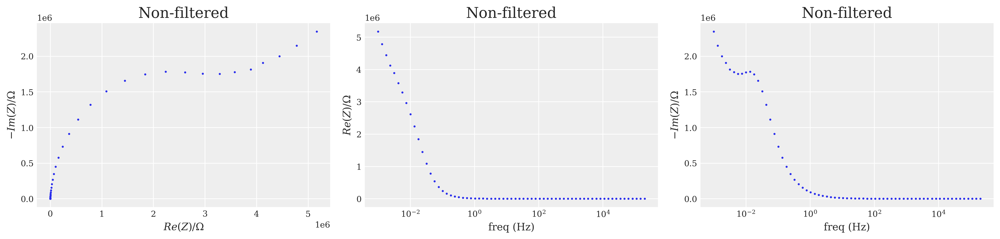

10 1.0 108234.07248105036
20 1.0 17791.147124981675
30 0.5999913219763766 14415.162216519633
ohmic_resistance = 139.9438


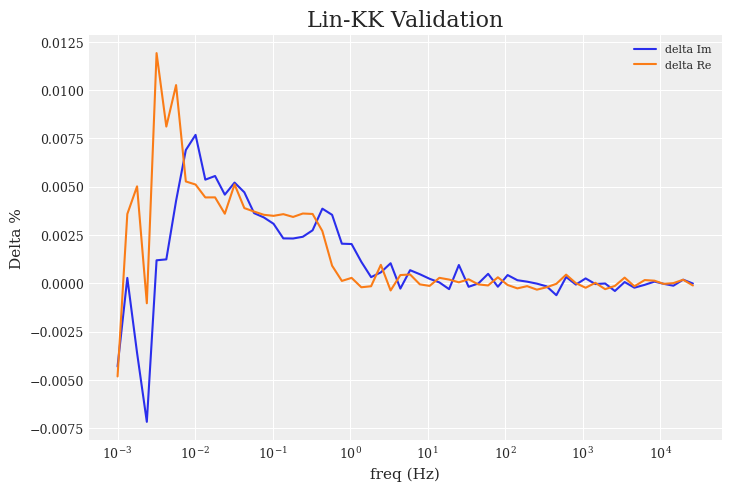

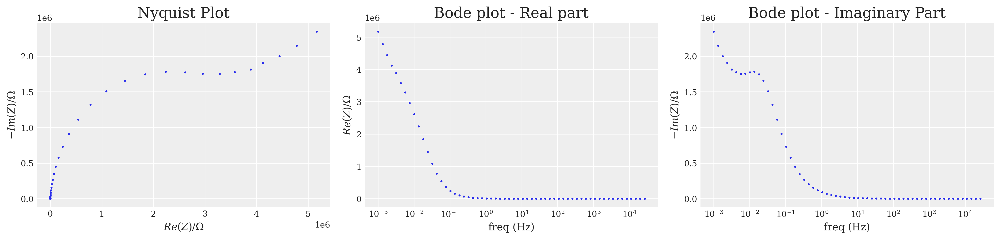

ECM generation in process
Circuit 0:[P1,P2]-R3 composed of components (['P1w', 'P1n', 'P2w', 'P2n', 'R3']) with values ([575500.0, 0.96242, 2456900.0, 0.16607, 142.06])
Julia circuit's fitting
r2_value:0.995671272277832
r2_real_part:0.9987452030181885
r2_imag_part:0.9848149418830872
MSE_value:11238633472.0
RMSE_value:106012.42130995782
RMSE_value:1.457017183303833


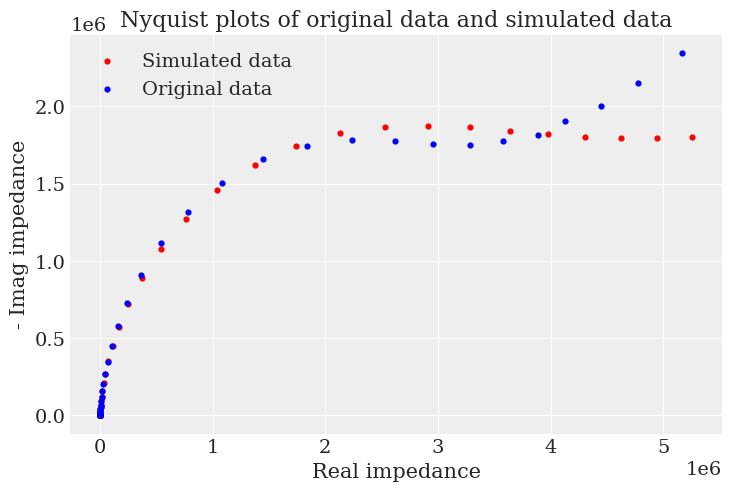

sample: 100%|████████████████████████| 11000/11000 [00:42<00:00, 259.15it/s, 63 steps of size 1.20e-02. acc. prob=0.86]


615443.8820913017
[P1,P2]-R3:Prior distributions with trajectories


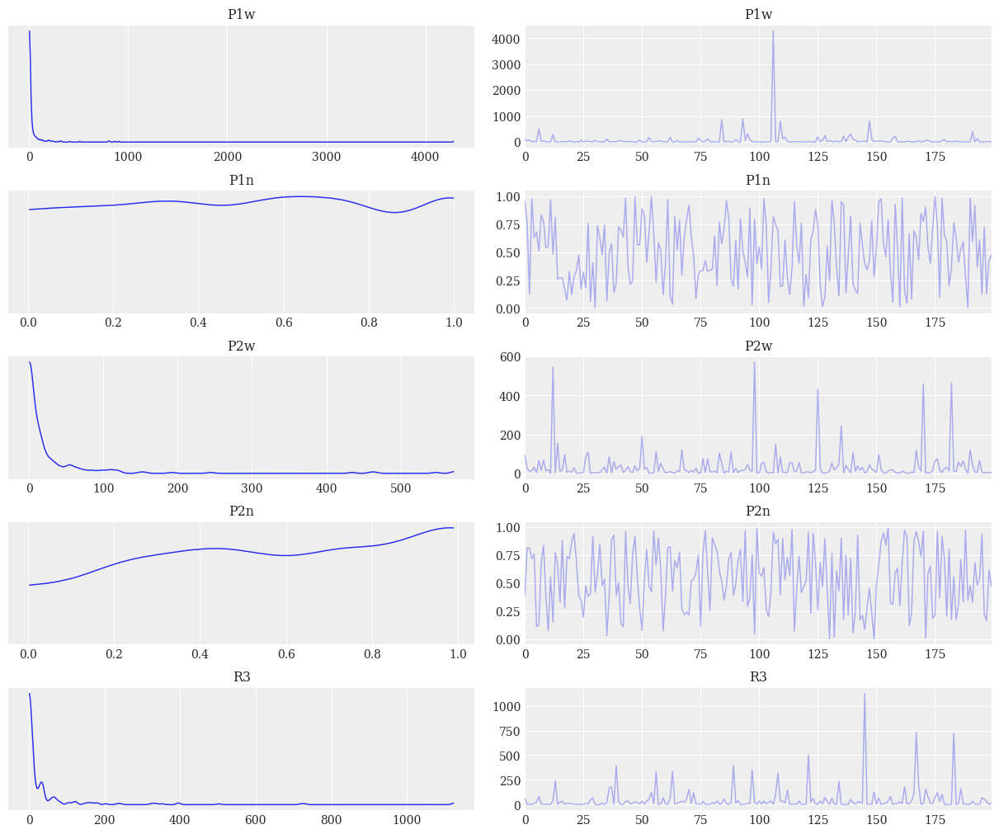

[P1,P2]-R3:Prior prediction


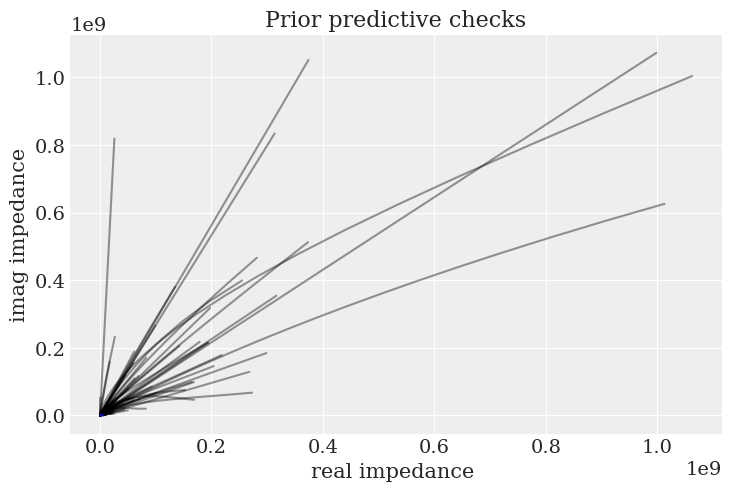

[P1,P2]-R3:Posterior distributions with HDI


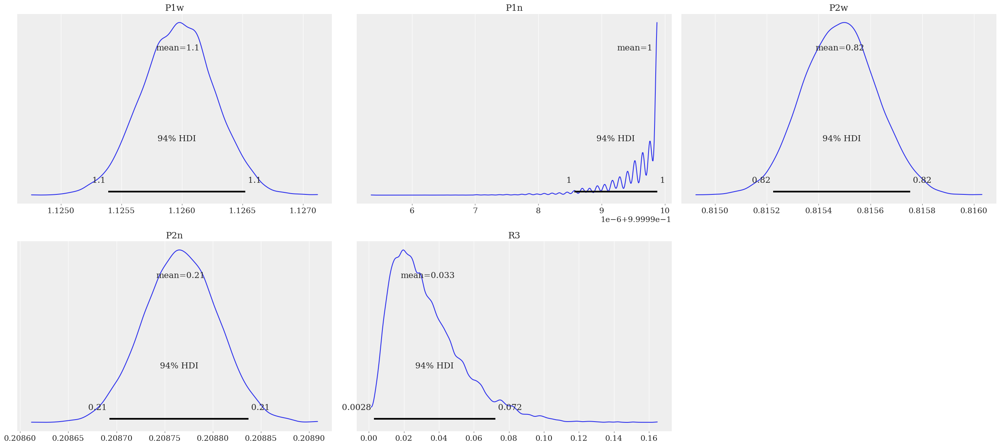

[P1,P2]-R3:Posterior distributions with trajectories


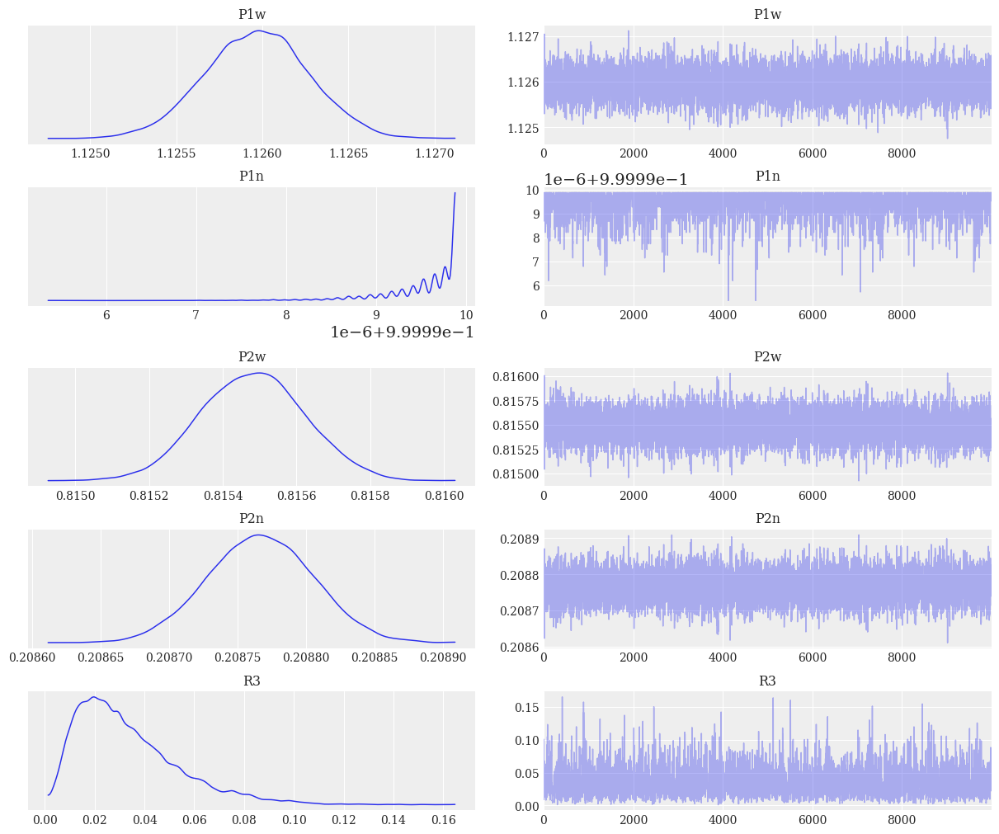

[P1,P2]-R3:Posterior predictions - real part
Posterior real part's fit: MAPE = 55.89366004943847; R2 = 0.9990955239534378


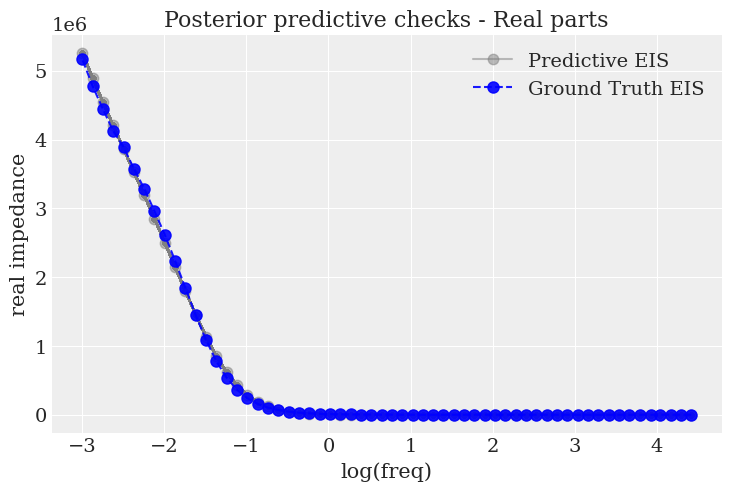

[P1,P2]-R3:Posterior predictions imag
Posterior imag part's fit: MAPE = 12.515571842193603; R2 = 0.9963054805994034


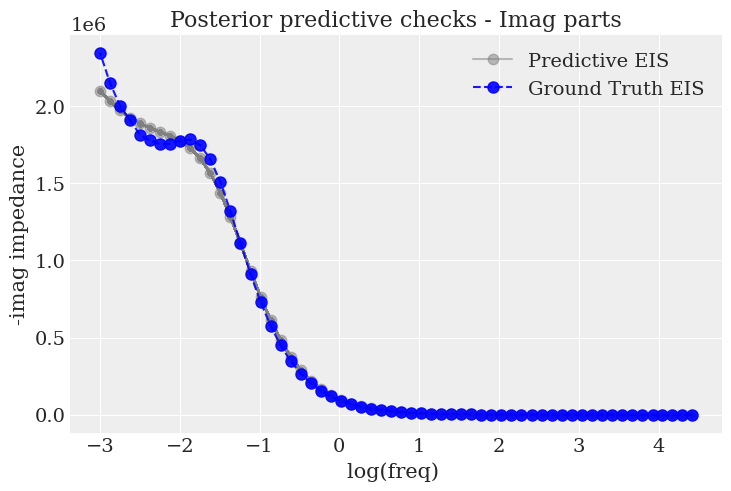

[P1,P2]-R3:Posterior predictions
Posterior fit: MAPE = 28.590479316711427; R2 = 0.9984798520803452


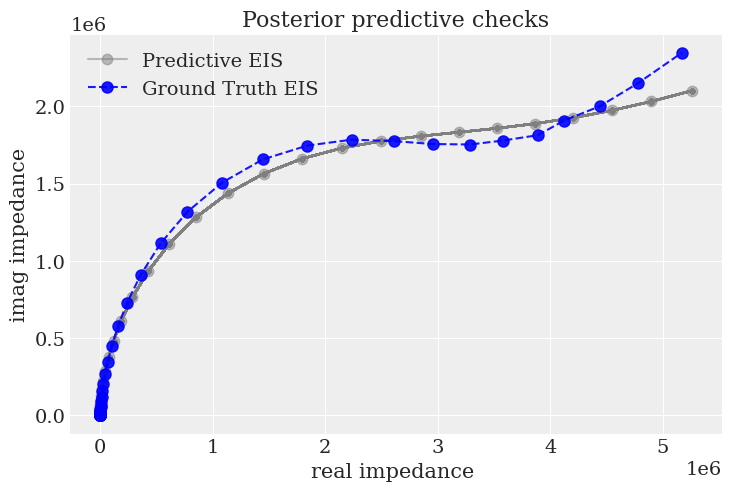

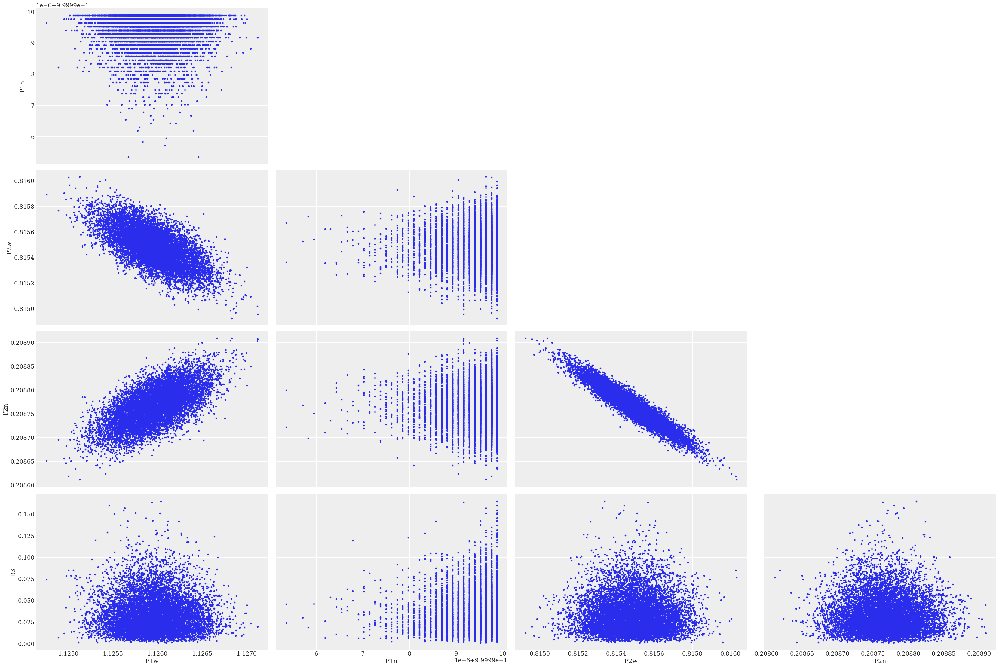

,Combined Circuits,Combined Values,Mathematical expressions,Counts,Different value sets,Variables_names,Variables_values,ECM Data,R_square,Mean Square Error,...,BI_models_description,Priors_prediction,Posterior_prediction,AIC Value,Posterior_mean_r2,Posterior_mean_mape,Posterior_mean_r2_real,Posterior_mean_mape_real,Posterior_mean_r2_imag,Posterior_mean_mape_imag
0,"[P1,P2]-R3","[[P1w = 575500.0, P1n = 0.96242, P2w = 2456900...",((X[0]*(2*np.pi*F)**(-X[1])*(np.cos((np.pi*X[1...,1,1,"[P1w, P1n, P2w, P2n, R3]","[575500.0, 0.96242, 2456900.0, 0.16607, 142.06]","[(142.38235-5.4531307j), (142.48598-7.205504j)...",0.995671,1.123863e+10,...,<bound method MCMC.print_summary of <numpyro.i...,"{'P1n': [0.96243346, 0.75821376, 0.12518907, 0...","{'P1n': [0.9999993, 0.9999994, 0.9999994, 0.99...",615443.882091,0.99848,28.590479,0.999096,55.89366,0.996305,12.515572


In [46]:
# Demo - just performed ECM generation twice
EIS_auto(impedance=measurements,freq=frequencies,data_path=data_path,iter_number=2)

## Analysis board - separately

### Set the julia environment

In [48]:
# define the path of julia program
j = set_julia (r"D:\Julia-1.7.2\bin\julia.exe")

# initialize the julia environment
#initialize_julia()

# set the parameter of plots
set_parameter()

### Data load

In [49]:
# Load the EIS data and get access to the impedance and frequencies
data_path = "Test_data.txt"
df = load_data(data_path)

frequencies = np.array(df["freq/Hz"]).astype(float)
reals = np.array(df["Re(Z)/Ohm"]).astype(float)
imags = -np.array(df["-Im(Z)/Ohm"]).astype(float)

measurements = reals + imags*1j
df

,freq/Hz,Re(Z)/Ohm,-Im(Z)/Ohm,|Z|/Ohm,Phase(Z)/deg,time/s,<Ewe>/V,<I>/mA,Unnamed: 8
0,200019.480000,1.304171e+02,3.468001e+01,1.349493e+02,-14.891262,10602.358770,-0.040436,-0.000995,NaN
1,149716.770000,1.341570e+02,2.727420e+01,1.369014e+02,-11.491652,10602.733761,-0.040460,-0.000747,NaN
2,112070.290000,1.364035e+02,2.157776e+01,1.380997e+02,-8.989165,10603.232750,-0.040456,-0.000728,NaN
3,83886.695000,1.377822e+02,1.727571e+01,1.388611e+02,-7.146687,10603.607774,-0.040450,-0.000785,NaN
4,62792.953000,1.385546e+02,1.434104e+01,1.392948e+02,-5.909335,10603.981767,-0.040452,-0.000817,NaN
...,...,...,...,...,...,...,...,...,...
62,0.003185,3.891231e+06,1.812847e+06,4.292796e+06,-24.979877,14375.134820,-0.040596,0.000014,NaN
63,0.002385,4.124008e+06,1.907837e+06,4.543928e+06,-24.826071,15634.709475,-0.040596,0.000012,NaN
64,0.001785,4.443237e+06,2.000512e+06,4.872823e+06,-24.239067,17317.803800,-0.040598,0.000011,NaN
65,0.001336,4.779632e+06,2.148920e+06,5.240490e+06,-24.208651,19566.115223,-0.040601,0.000009,NaN


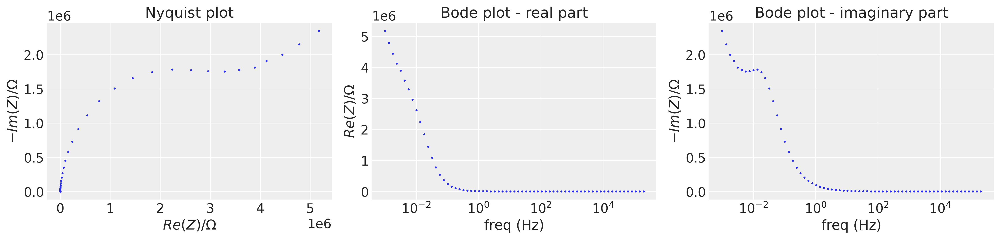

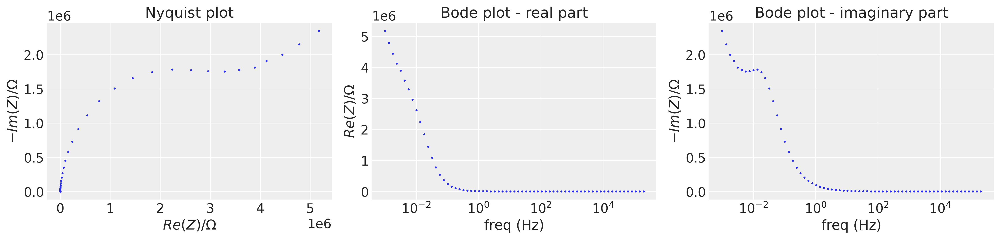

In [53]:
plot_EIS(freq=frequencies,impedance = measurements)

### Data Pre-processing

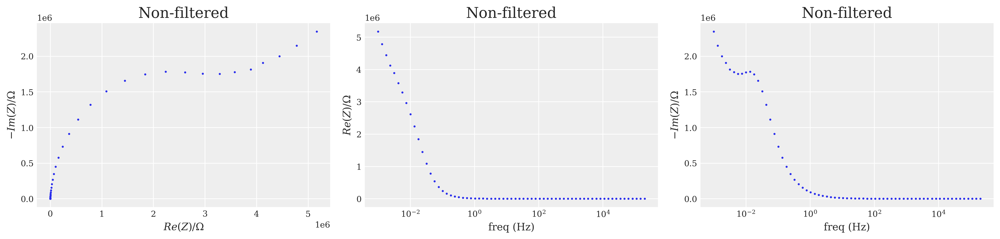

10 1.0 108234.07248105036
20 1.0 17791.147124981675
30 0.5999913219763766 14415.162216519633
ohmic_resistance = 139.9438


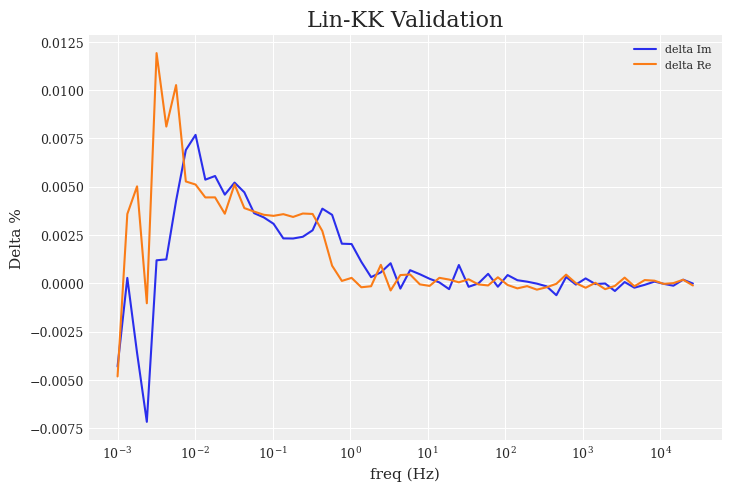

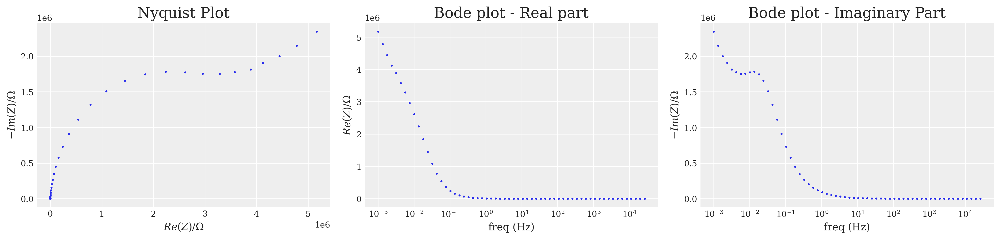

In [50]:
# perform data pre-processing by dropping positive imaginary parts at high frequency and invalidated data according to KK validation
data_processed,ohmic_resistance,RMSE = pre_processing(measurements,frequencies,0.05,data_path) # 0.05 is defined by users

In [54]:
# save the pre-processed data for ECM generation
path_data_preprocessed = save_processed_data(input_name=data_path,data_stored=data_processed)

### Heuristic filtering process

In [51]:
# smaller complexity + higher threshold
path_results = "df_circuits.csv"
df_circuits = load_results(file_path = path_results)
df_circuits = split_components(df_circuits)
df_circuits = capacitance_filter(df_circuits)
df_circuits = series_filter(df_circuits)
df_circuits = ohmic_resistance_filter(df_circuits,ohmic_resistance)
df_circuits = generate_mathematical_expression(df_circuits)
new_df = combine_expression(df_circuits)
new_df = calculate_length(new_df)
new_df = split_variables(new_df)
new_df

,Combined Circuits,Combined Values,Mathematical expressions,Counts,Different value sets,Variables_names,Variables_values
0,"[P1,P2-R3]-[R4,P5]-R6","[[P1w = 551600.0, P1n = 0.95574, P2w = 457340....",((X[0]*(2*np.pi*F)**(-X[1])*(np.cos((np.pi*X[1...,1,1,"[P1w, P1n, P2w, P2n, R3, R4, P5w, P5n, R6]","[551600.0, 0.95574, 457340.0, 0.39435, 2711700..."
1,"R1-[P2,P3]","[[R1 = 142.06, P2w = 575500.0, P2n = 0.96242, ...",X[0]+((X[1]*(2*np.pi*F)**(-X[2])*(np.cos((np.p...,4,1,"[R1, P2w, P2n, P3w, P3n]","[142.06, 575500.0, 0.96242, 2456900.0, 0.16607]"
2,"[P1,P2-R3]-R4","[[P1w = 550270.0, P1n = 0.95492, P2w = 439460....",((X[0]*(2*np.pi*F)**(-X[1])*(np.cos((np.pi*X[1...,4,1,"[P1w, P1n, P2w, P2n, R3, R4]","[550270.0, 0.95492, 439460.0, 0.40024, 2754000..."
3,"R1-[P2-R3,[R4,P5]]","[[R1 = 141.24, P2w = 439430.0, P2n = 0.40173, ...",X[0]+((X[1]*(2*np.pi*F)**(-X[2])*(np.cos((np.p...,1,1,"[R1, P2w, P2n, R3, R4, P5w, P5n]","[141.24, 439430.0, 0.40173, 2765400.0, 1000000..."


### ECM evaluation through heuristic filtering and Bayesian inference

Circuit 0:[P1,P2-R3]-[R4,P5]-R6 composed of components (['P1w', 'P1n', 'P2w', 'P2n', 'R3', 'R4', 'P5w', 'P5n', 'R6']) with values ([551600.0, 0.95574, 457340.0, 0.39435, 2711700.0, 15.441, 1124600.0, 0.8835, 126.96])
Julia circuit's fitting
r2_value:0.9998455047607422
r2_real_part:0.9999098181724548
r2_imag_part:0.9996181726455688
MSE_value:401180896.0
RMSE_value:20029.500642801857
RMSE_value:0.8263201713562012


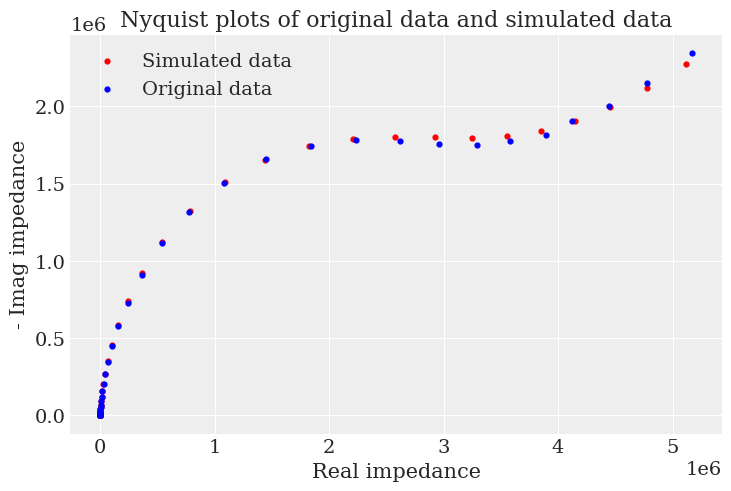

sample: 100%|███████████████████████| 11000/11000 [02:23<00:00, 76.52it/s, 1023 steps of size 4.34e-04. acc. prob=0.85]


154027.96857203543
[P1,P2-R3]-[R4,P5]-R6:Prior distributions with trajectories


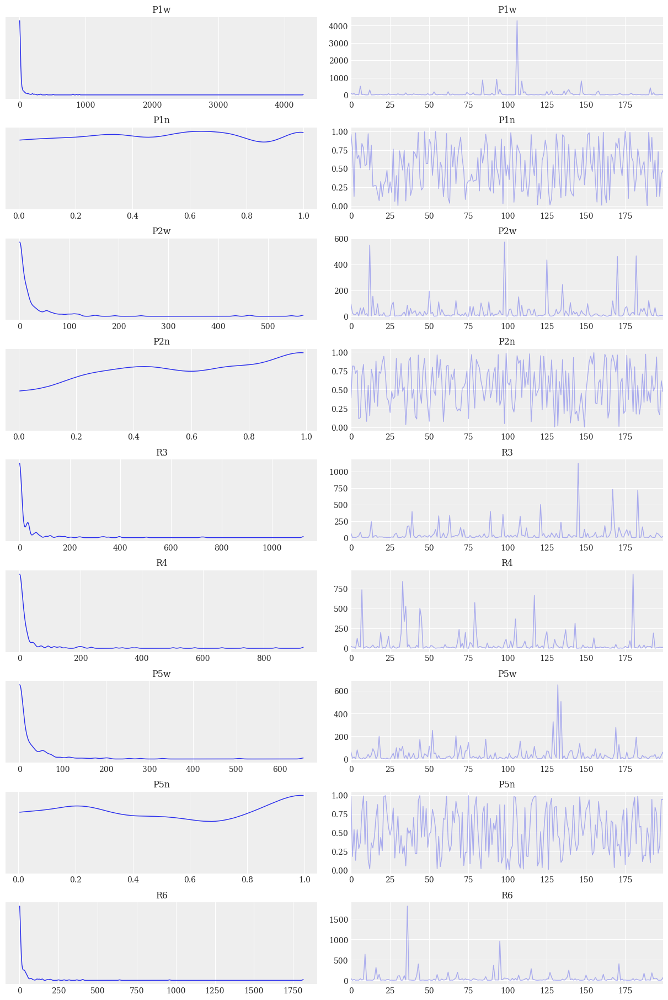

[P1,P2-R3]-[R4,P5]-R6:Prior prediction


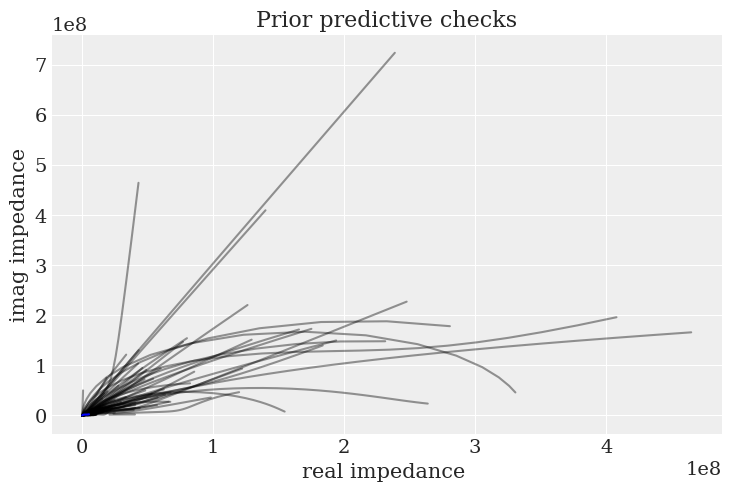

[P1,P2-R3]-[R4,P5]-R6:Posterior distributions with HDI


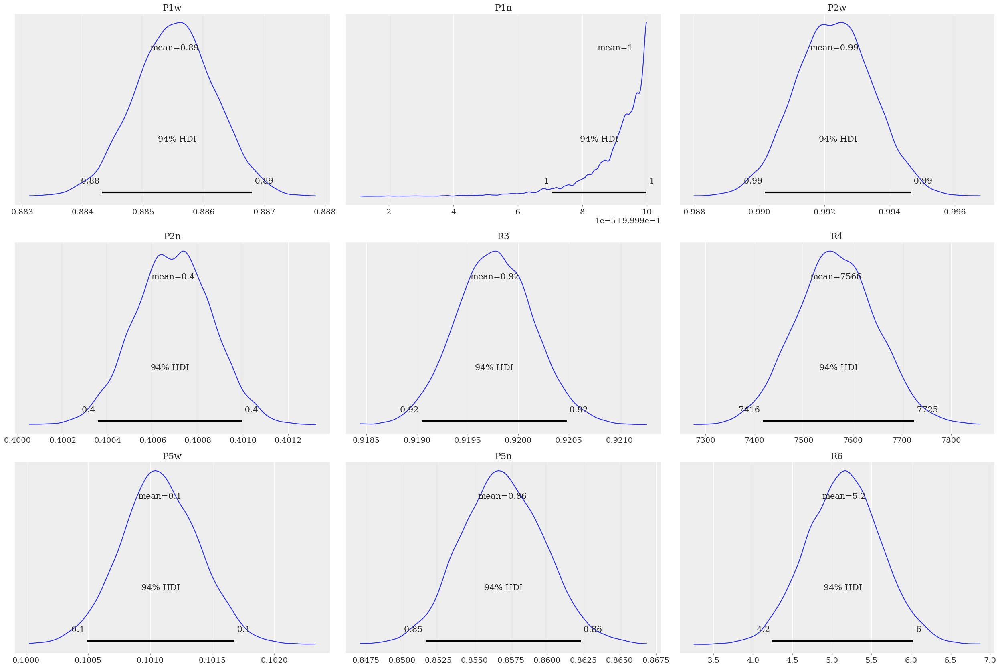

[P1,P2-R3]-[R4,P5]-R6:Posterior distributions with trajectories


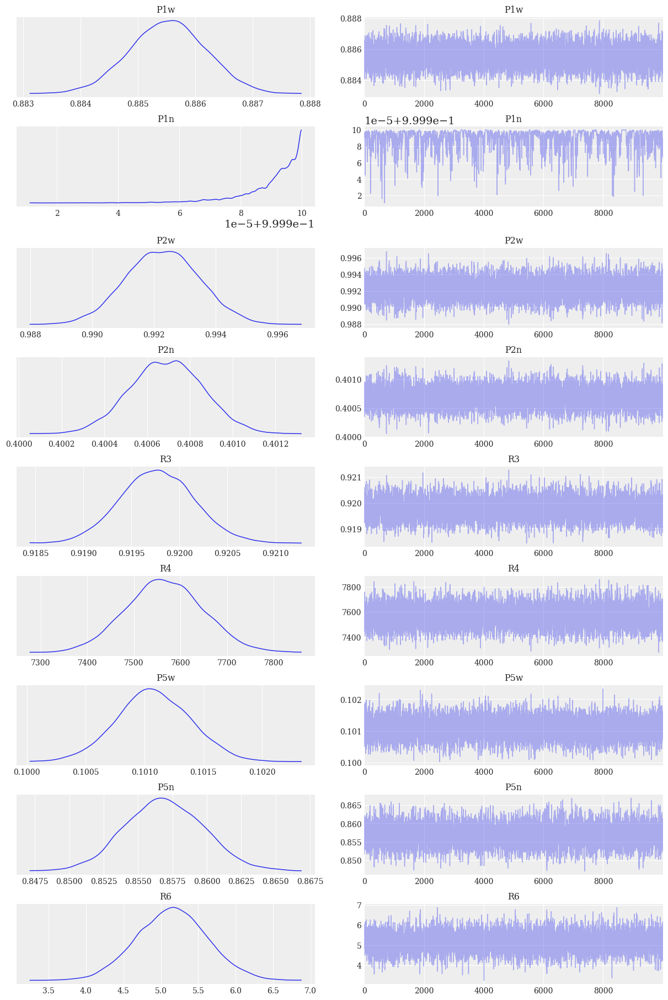

[P1,P2-R3]-[R4,P5]-R6:Posterior predictions - real part
Posterior real part's fit: MAPE = 138.59080825805665; R2 = 0.9999487602710724


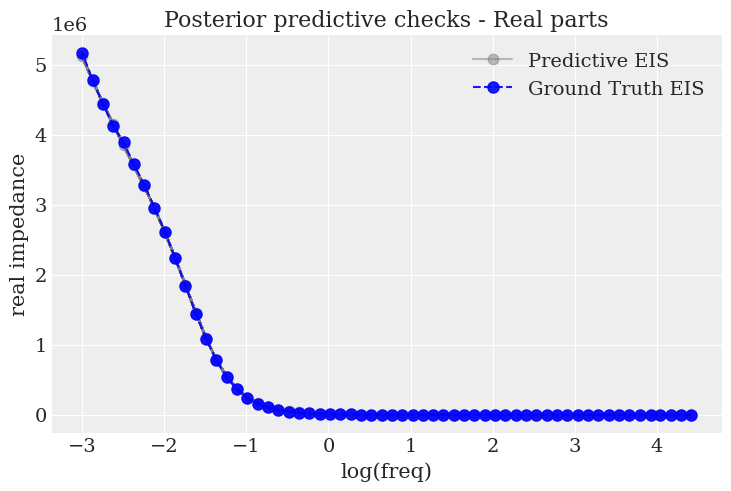

[P1,P2-R3]-[R4,P5]-R6:Posterior predictions imag
Posterior imag part's fit: MAPE = 4.8605594730377195; R2 = 0.9997924876213073


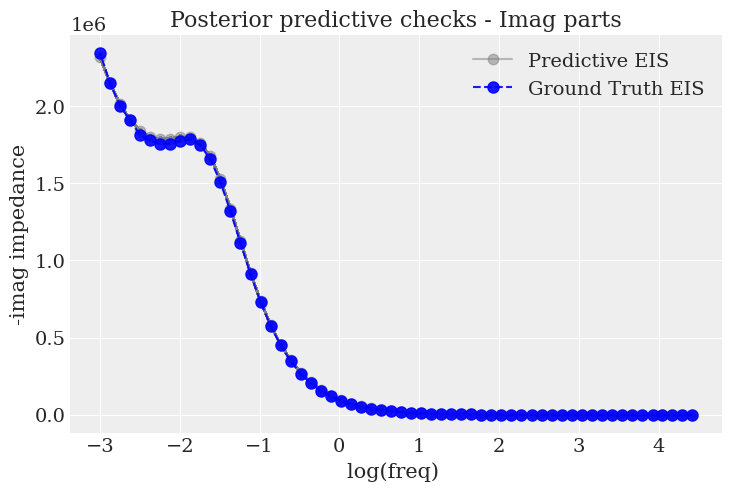

[P1,P2-R3]-[R4,P5]-R6:Posterior predictions
Posterior fit: MAPE = 90.21714309692383; R2 = 0.999914288520813


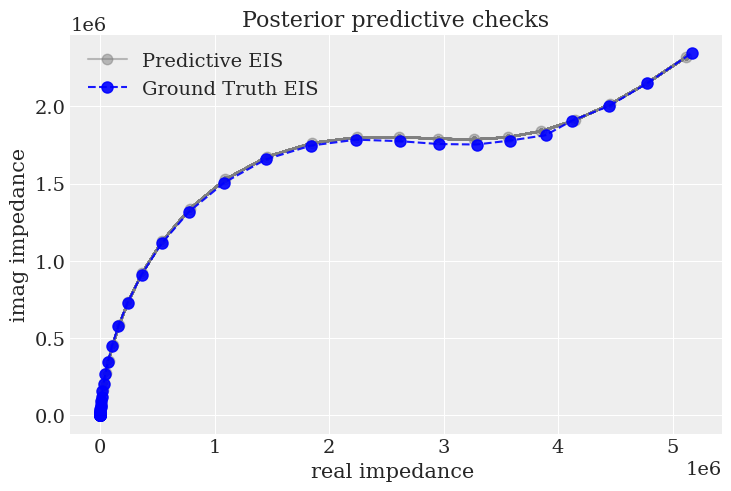

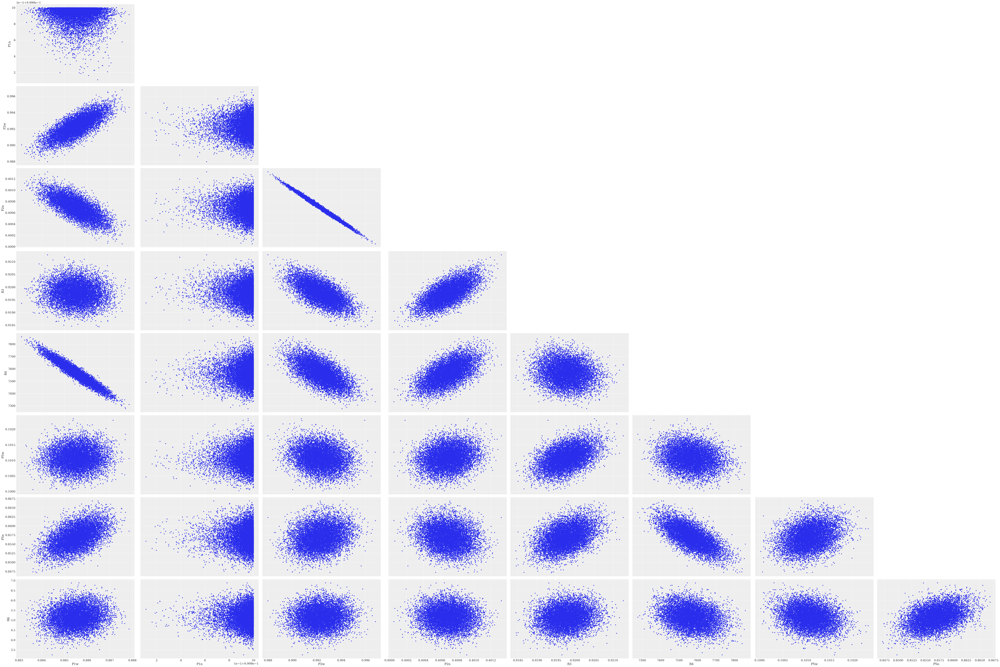

Circuit 1:R1-[P2,P3] composed of components (['R1', 'P2w', 'P2n', 'P3w', 'P3n']) with values ([142.06, 575500.0, 0.96242, 2456900.0, 0.16607])
Julia circuit's fitting
r2_value:0.995671272277832
r2_real_part:0.9987452030181885
r2_imag_part:0.9848149418830872
MSE_value:11238633472.0
RMSE_value:106012.42130995782
RMSE_value:1.457017183303833


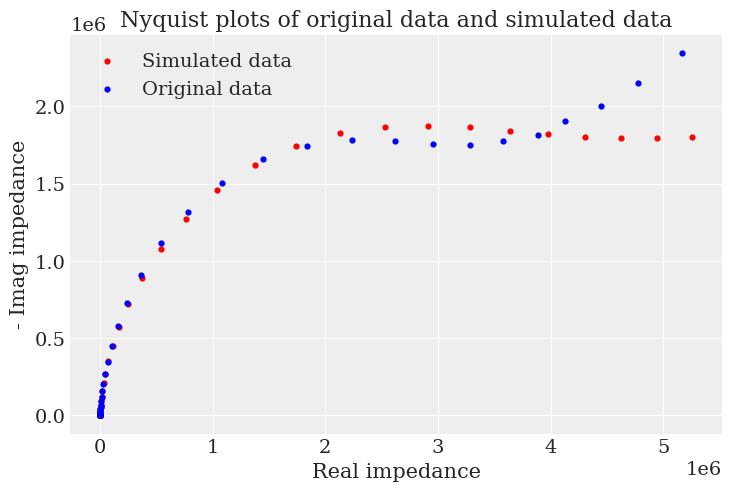

sample: 100%|████████████████████████| 11000/11000 [00:38<00:00, 284.94it/s, 31 steps of size 1.33e-02. acc. prob=0.85]


617585.8501750153
R1-[P2,P3]:Prior distributions with trajectories


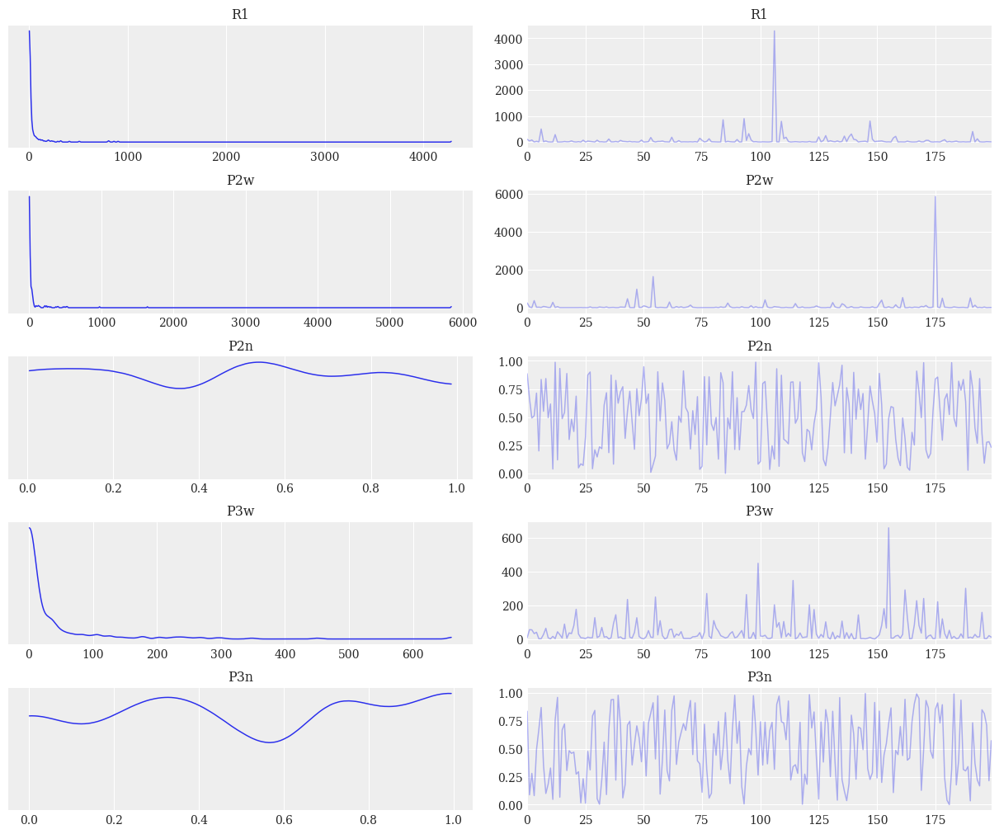

R1-[P2,P3]:Prior prediction


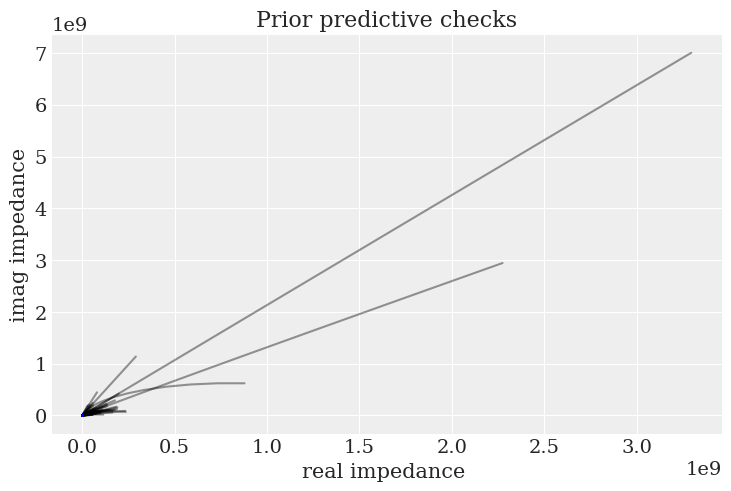

R1-[P2,P3]:Posterior distributions with HDI


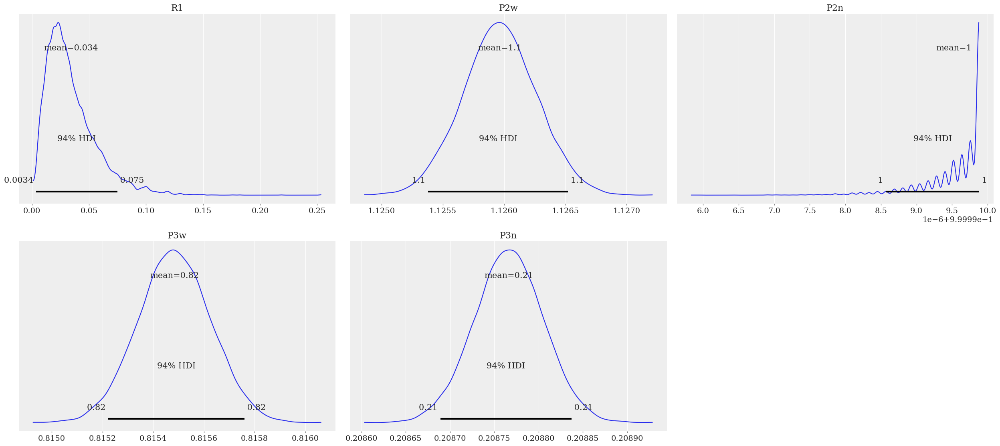

R1-[P2,P3]:Posterior distributions with trajectories


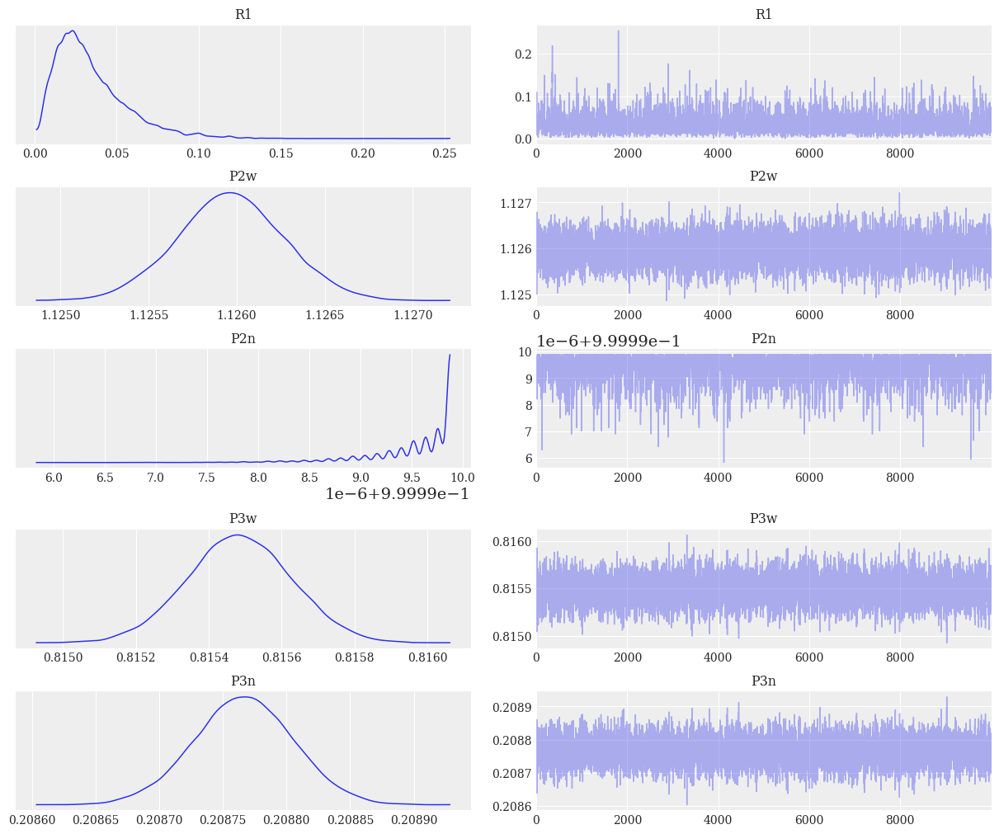

R1-[P2,P3]:Posterior predictions - real part
Posterior real part's fit: MAPE = 55.878629264831545; R2 = 0.9990955871343613


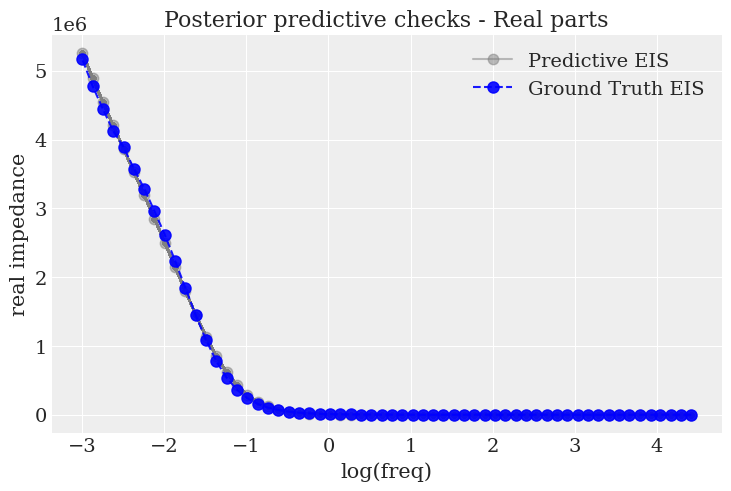

R1-[P2,P3]:Posterior predictions imag
Posterior imag part's fit: MAPE = 12.516248435974122; R2 = 0.9963052576780319


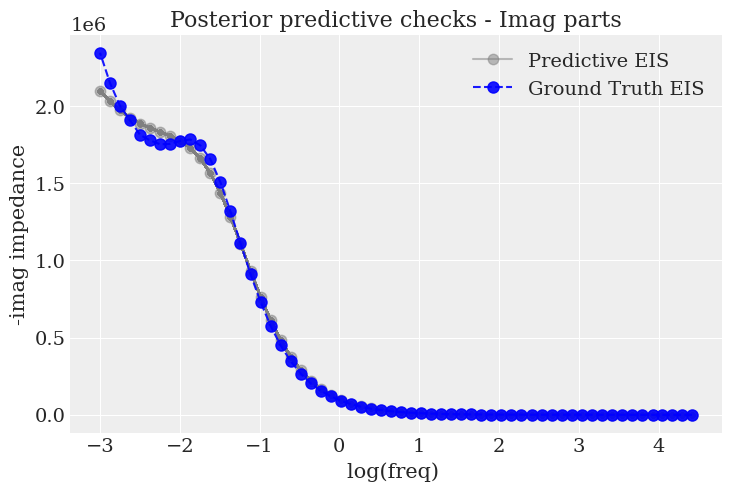

R1-[P2,P3]:Posterior predictions
Posterior fit: MAPE = 28.580481204986572; R2 = 0.9984798508882523


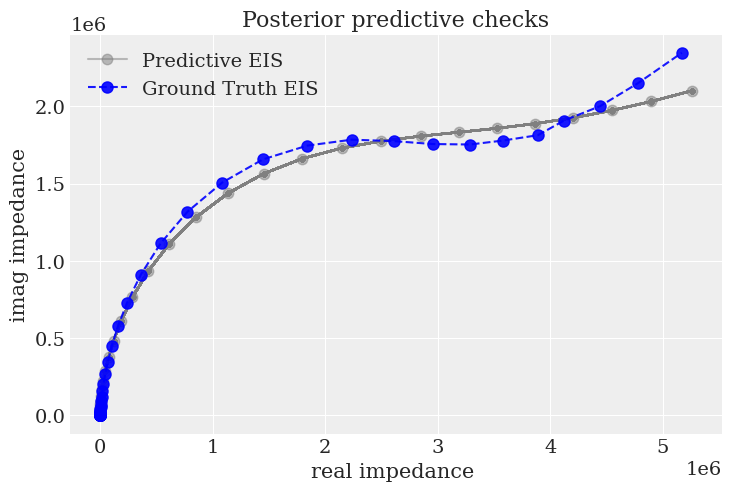

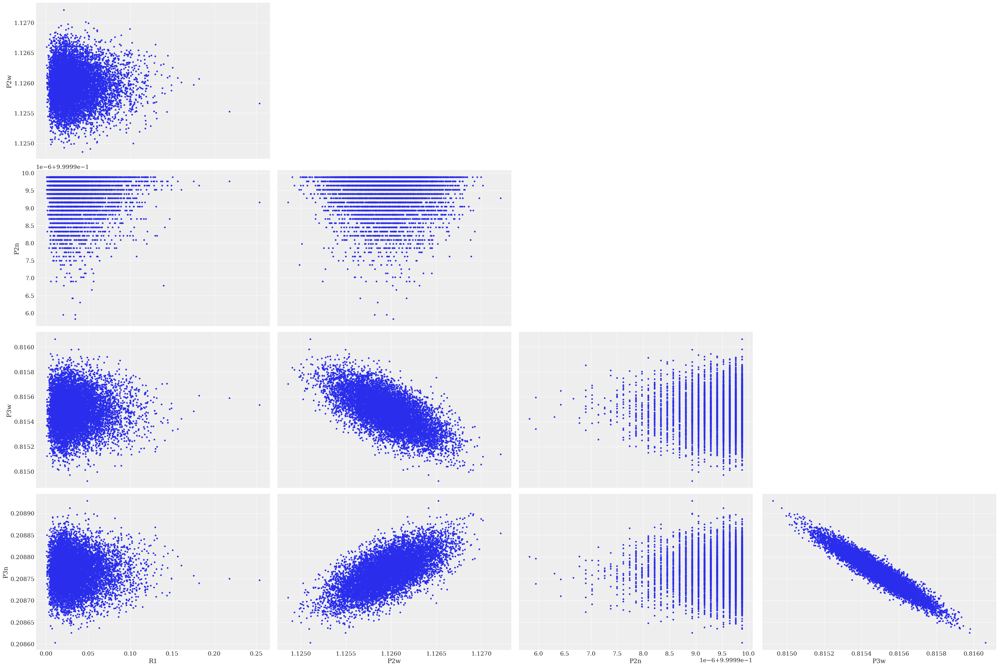

Circuit 2:[P1,P2-R3]-R4 composed of components (['P1w', 'P1n', 'P2w', 'P2n', 'R3', 'R4']) with values ([550270.0, 0.95492, 439460.0, 0.40024, 2754000.0, 141.24])
Julia circuit's fitting
r2_value:0.9998528361320496
r2_real_part:0.9999082088470459
r2_imag_part:0.9996573328971863
MSE_value:382074592.0
RMSE_value:19546.728421912452
RMSE_value:1.0014210939407349


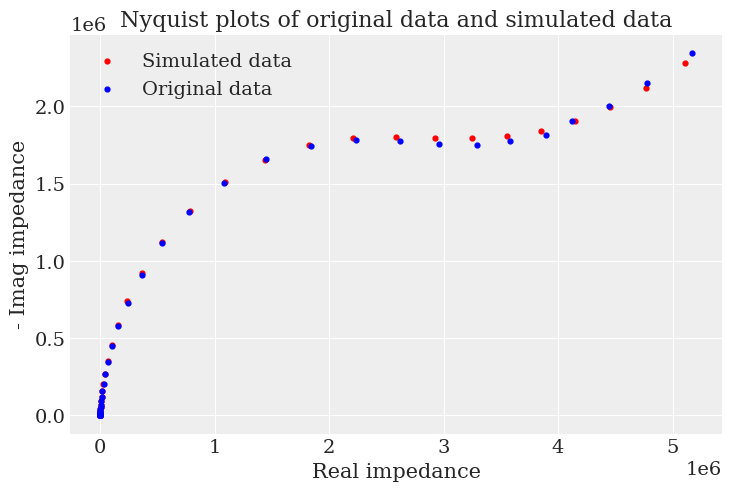

sample: 100%|███████████████████████| 11000/11000 [00:40<00:00, 269.12it/s, 151 steps of size 6.58e-03. acc. prob=0.86]


164433.99631640315
[P1,P2-R3]-R4:Prior distributions with trajectories


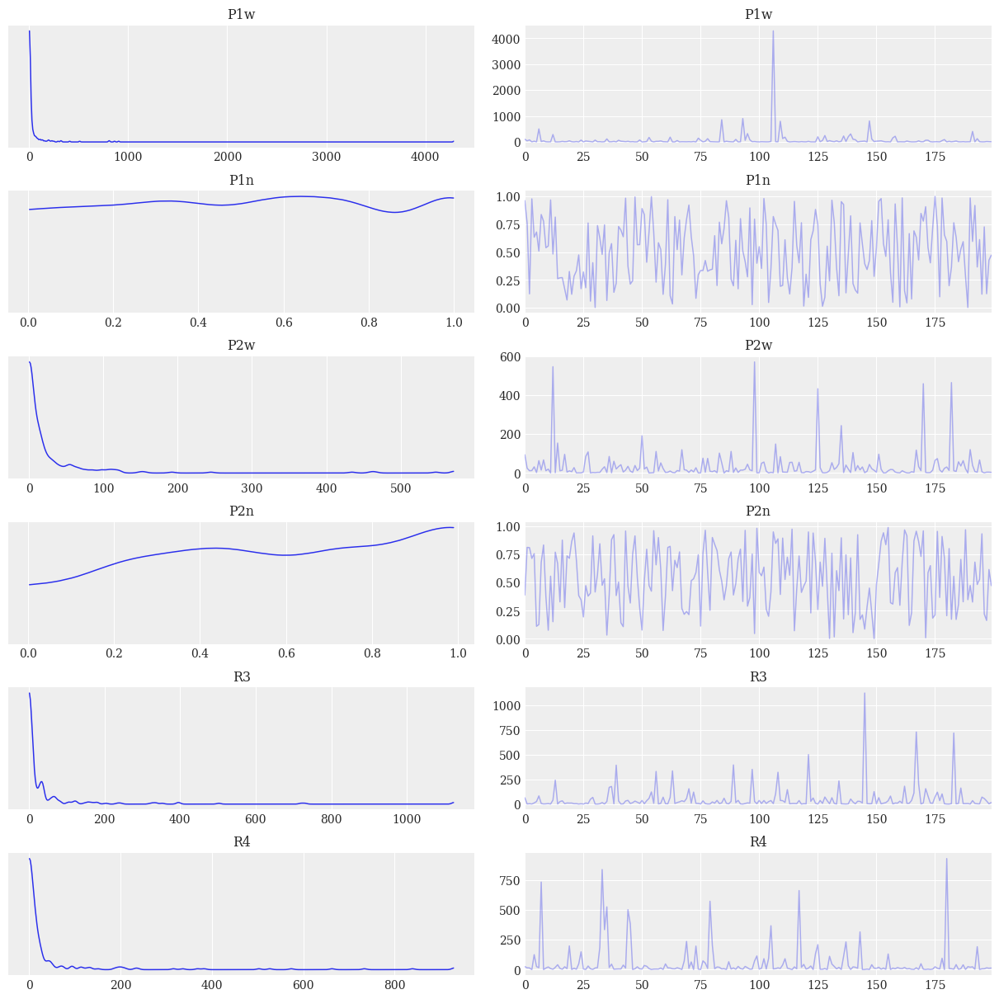

[P1,P2-R3]-R4:Prior prediction


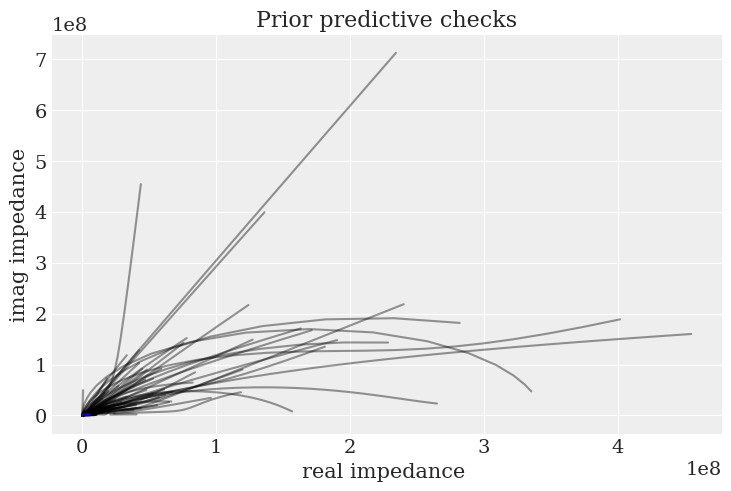

[P1,P2-R3]-R4:Posterior distributions with HDI


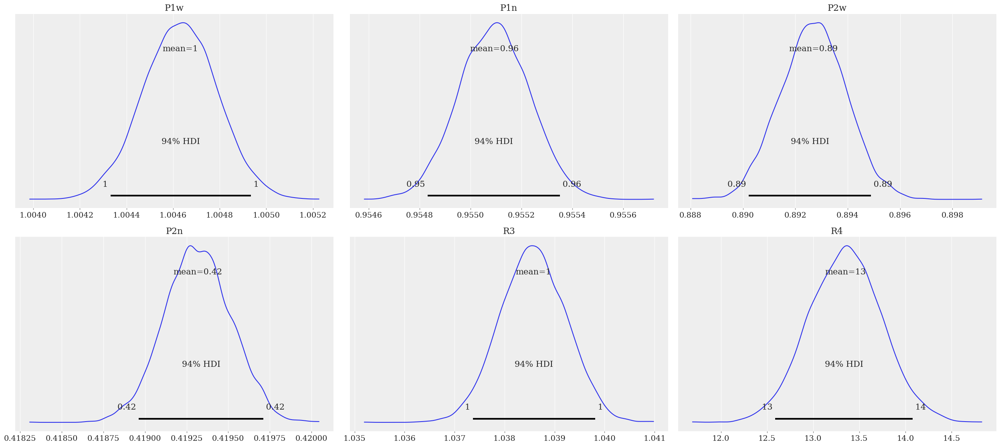

[P1,P2-R3]-R4:Posterior distributions with trajectories


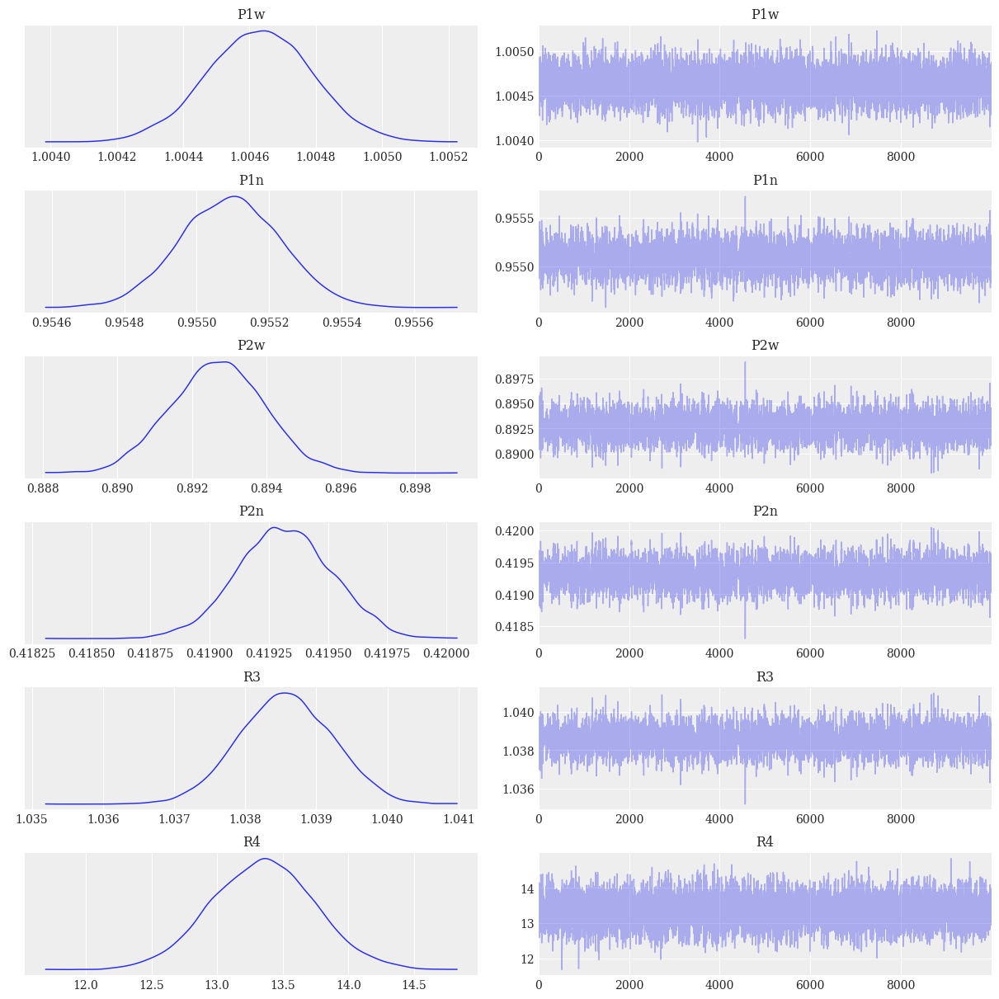

[P1,P2-R3]-R4:Posterior predictions - real part
Posterior real part's fit: MAPE = 448.17472259521486; R2 = 0.999942113161087


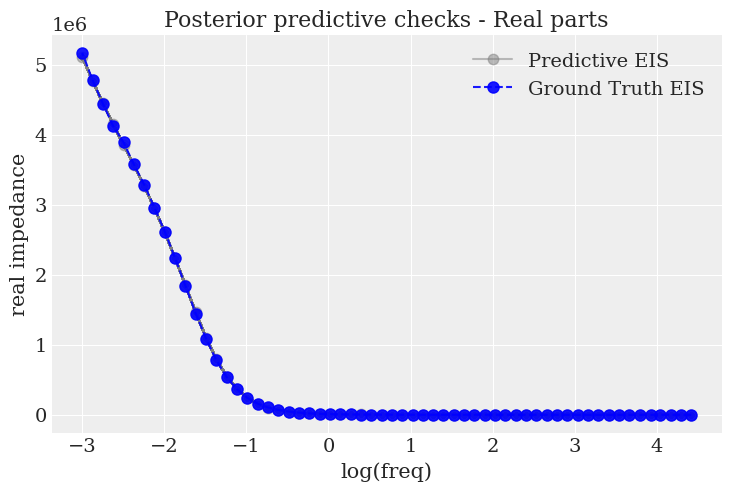

[P1,P2-R3]-R4:Posterior predictions imag
Posterior imag part's fit: MAPE = 3.5973591780662537; R2 = 0.9997531950473786


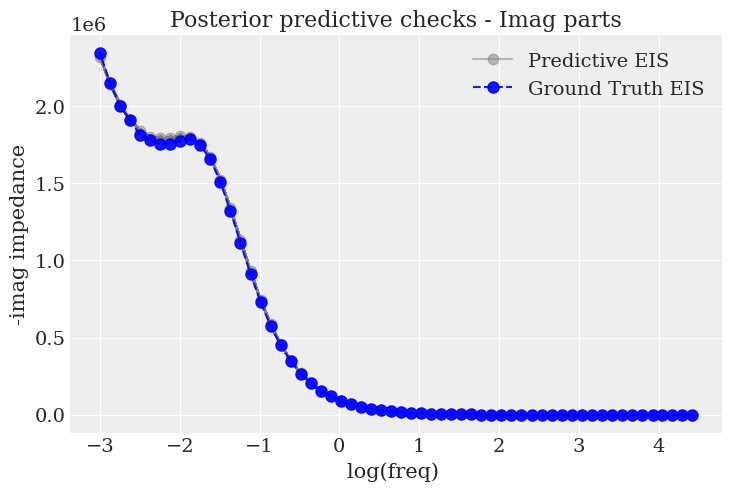

[P1,P2-R3]-R4:Posterior predictions
Posterior fit: MAPE = 296.7594589233398; R2 = 0.9999004006385803


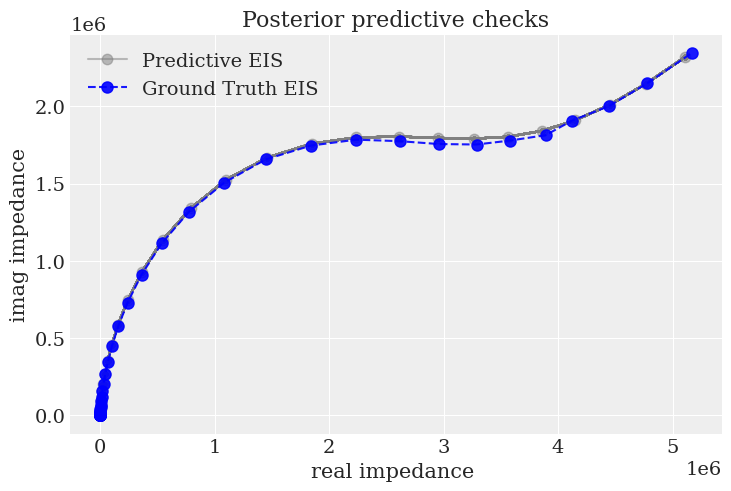

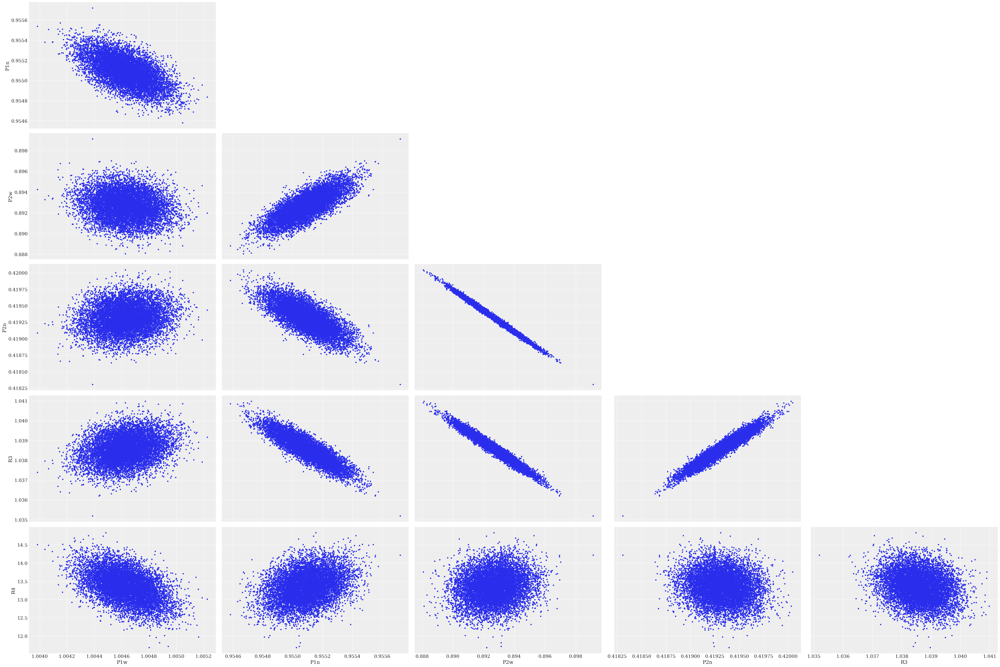

Circuit 3:R1-[P2-R3,[R4,P5]] composed of components (['R1', 'P2w', 'P2n', 'R3', 'R4', 'P5w', 'P5n']) with values ([141.24, 439430.0, 0.40173, 2765400.0, 1000000000.0, 550230.0, 0.95491])
Julia circuit's fitting
r2_value:0.9998533129692078
r2_real_part:0.9999087452888489
r2_imag_part:0.999657392501831
MSE_value:380863552.0
RMSE_value:19515.725761549325
RMSE_value:1.0018460750579834


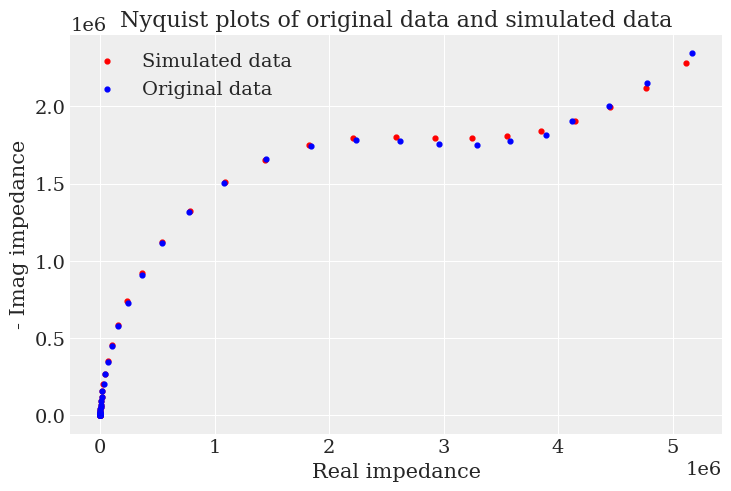

sample: 100%|███████████████████████| 11000/11000 [03:01<00:00, 60.73it/s, 1023 steps of size 1.22e-08. acc. prob=0.85]


28940724.196525976
R1-[P2-R3,[R4,P5]]:Prior distributions with trajectories


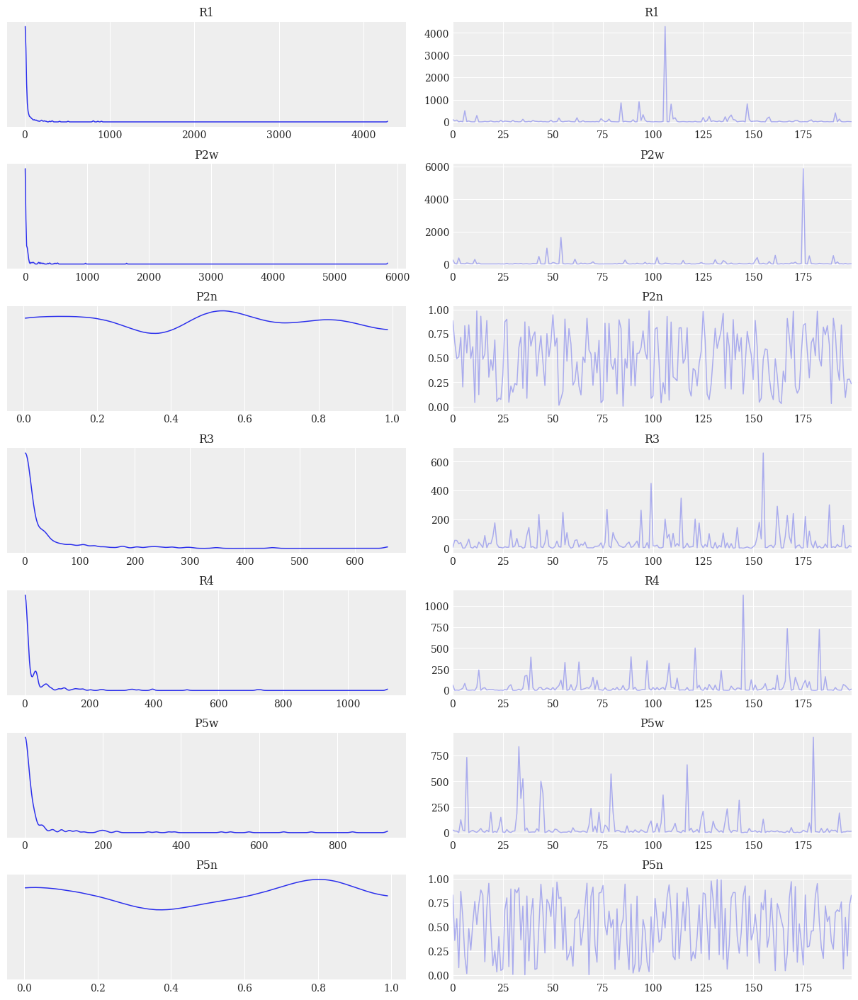

R1-[P2-R3,[R4,P5]]:Prior prediction


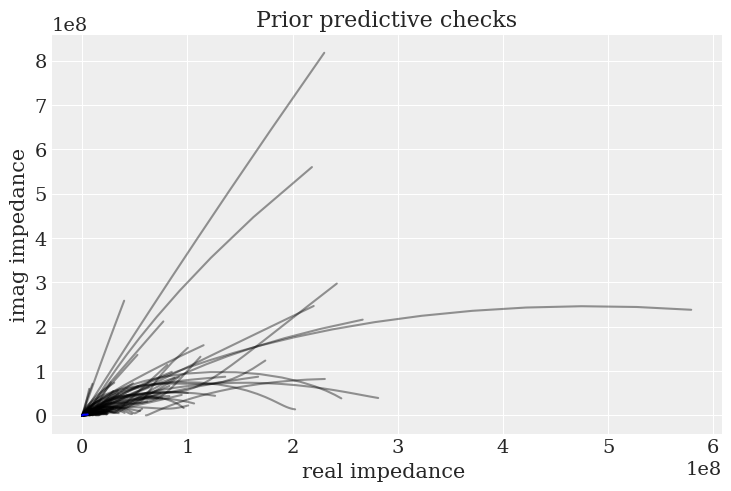

R1-[P2-R3,[R4,P5]]:Posterior distributions with HDI


ValueError: Image size of 1949x131505 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2484x1656 with 9 Axes>

R1-[P2-R3,[R4,P5]]:Posterior distributions with trajectories


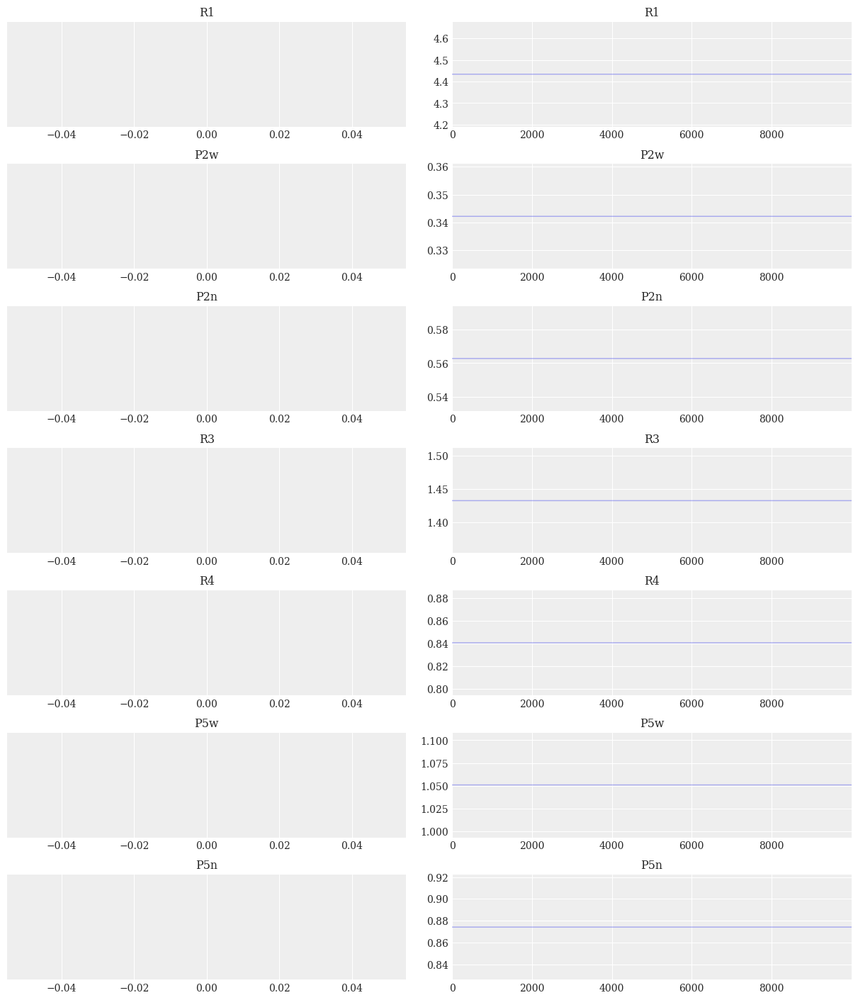

R1-[P2-R3,[R4,P5]]:Posterior predictions - real part
Posterior real part's fit: MAPE = 206.58226013183594; R2 = 0.9995561242103577


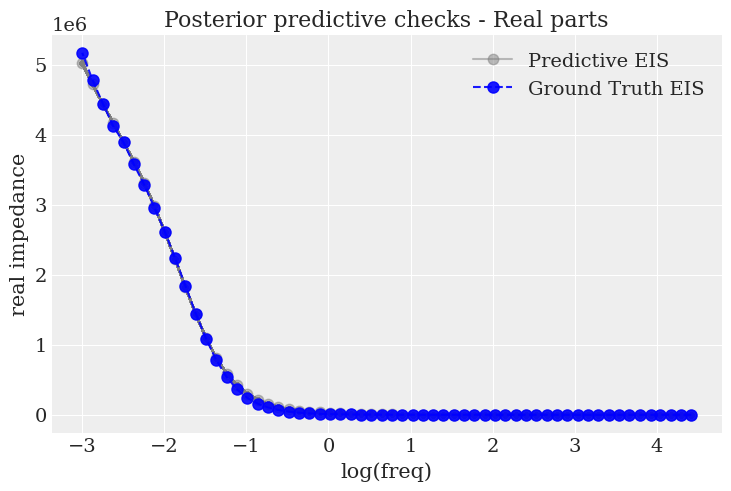

R1-[P2-R3,[R4,P5]]:Posterior predictions imag
Posterior imag part's fit: MAPE = 45.91569137573242; R2 = 0.9992152452468872


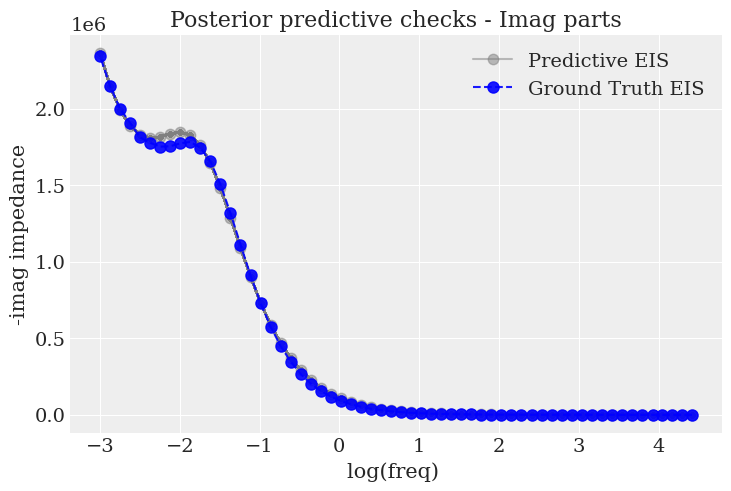

R1-[P2-R3,[R4,P5]]:Posterior predictions
Posterior fit: MAPE = 105.59101867675781; R2 = 0.9994809031486511


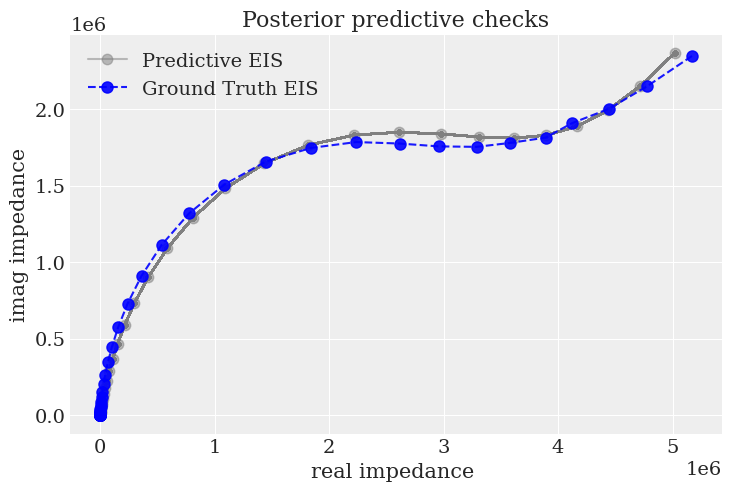

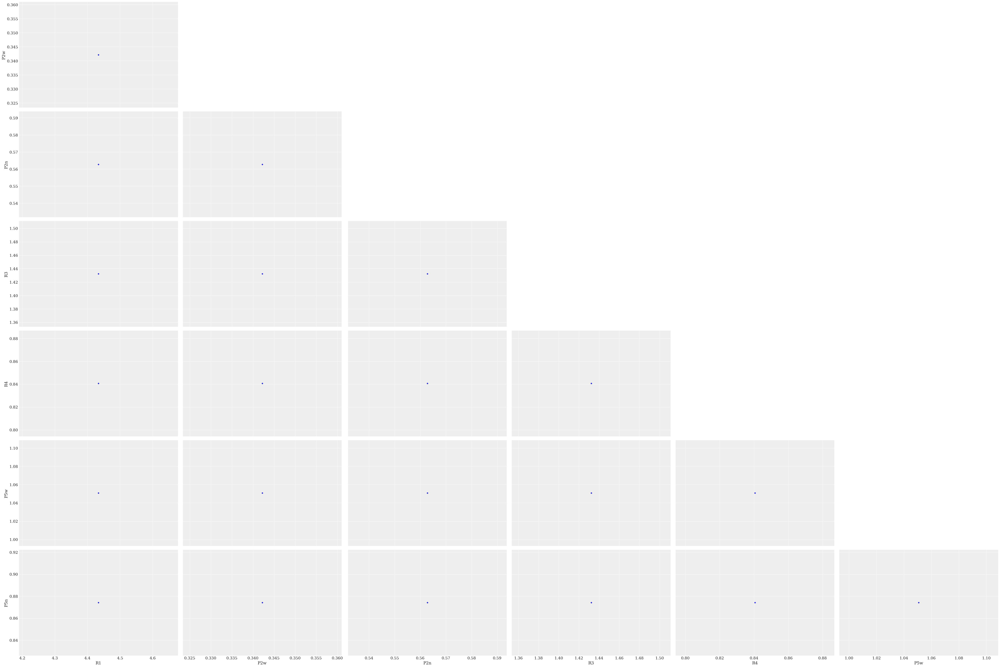

In [191]:
results = Bayesian_inference(data = data_processed, data_path = data_path, df = new_df)